In [1]:
from casatasks import *
# from casatools import *
import casatools
import os
from auto_selfcal_wsclean import *

# from calibration_script_v3 import *
from casaplotms import plotms
from casaviewer.imview import imview
import glob

msmd = casatools.msmetadata()
ms = casatools.ms()
tb = casatools.table()
import matplotlib as mpl
def reset_rc_params():
    mpl.rcParams.update({'font.size': 14, 
        'mathtext.fontset': 'stix',
        "text.usetex": False,
        "font.family": "sans-serif",
        "font.family": "sans",
        "font.serif": ["Exo 2"],
        "font.sans-serif": ["Exo 2"],
        'font.family': 'STIXGeneral', 
        'xtick.labelsize':16,
        'ytick.labelsize':16,
        'axes.labelsize' : 16,
        'xtick.major.width':1,
        'ytick.major.width':1,
        'axes.linewidth':1,
        'lines.linewidth':2,
        'legend.fontsize':14,
        "grid.linestyle":'--',                
        })
    pass
reset_rc_params()


                                                          ..___|**_
                                                  .|||||||||*+@+*__*++.
                                              _||||.           .*+;].,#_
                                         _|||*_                _    .@@@#@.
                                   _|||||_               .@##@#| _||_
   Radio Morphen              |****_                   .@.,/\..@_.
                             #///#+++*|    .       .@@@;#.,.\@.
                              .||__|**|||||*||*+@#];_.  ;,;_
 Geferson Lucatelli                            +\*_.__|**#
                                              |..      .]]
                                               ;@       @.*.
                                                #|       _;]];|.
                                                 ]_          _+;]@.
                                                 _/_             |]\|    .  _
                                              ...._@* __ .

In [2]:
import sys
sys.path.append('../libs/')

# from libs import *


In [3]:
from plotting import *
from read_data import *
from image_operations import *


In [4]:
import libs as mlibs


                                                          ..___|**_
                                                  .|||||||||*+@+*__*++.
                                              _||||.           .*+;].,#_
                                         _|||*_                _    .@@@#@.
                                   _|||||_               .@##@#| _||_
   Radio Morphen              |****_                   .@.,/\..@_.
                             #///#+++*|    .       .@@@;#.,.\@.
                              .||__|**|||||*||*+@#];_.  ;,;_
 Geferson Lucatelli                            +\*_.__|**#
                                              |..      .]]
                                               ;@       @.*.
                                                #|       _;]];|.
                                                 ]_          _+;]@.
                                                 _/_             |]\|    .  _
                                              ...._@* __ .

In [5]:
# # proj_name = '.calibrated'
# proj_name = '_combined_w_0.75'
# image_list = ['UGC8696']#,'VV250a','VV705']
path = '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/'
field = 'IRAS03359+15.sc'
g_name = path + field
g_vis = g_name + '.ms'
imsize = 1024 * 4
cell = '0.05arcsec'
FIELD_SHIFT = "'03:38:45.637 +15.32.09.933'"

In [6]:
steps=['save_init_flags','startup']
# steps=['startup']

In [7]:
if 'save_init_flags' in steps:
    if not os.path.exists(g_name+'.ms.flagversions/flags.Original/'):
        flagmanager(vis=g_name+'.ms',mode='save',versionname='Original',
            comment='Original flags.')
        statwt(vis=g_vis, statalg='chauvenet',timebin='60s',datacolumn='data')
    else:
        print('     ==> Skipping flagging backup init (exists).')
        print('     ==> Restoring flags to original...')
        flagmanager(vis=g_name+'.ms',mode='restore',versionname='Original')
        statwt(vis=g_vis, statalg='chauvenet',timebin='60s',datacolumn='data')
    

if 'startup' in steps:
    if not os.path.exists(path+'selfcal/'):
        os.makedirs(path+'selfcal/')
    if not os.path.exists(path+'selfcal/plots'):
        os.makedirs(path+'selfcal/plots')

....10....20....30....40....50....60....70....80....90....100%


In [8]:
summary = flagdata(vis=g_name+'.ms', field='',mode='summary')
report_flag(summary,'field')

field IRAS03359+15:  36.4 percent flagged


In [9]:
# plotms(vis=g_vis,
#        yaxis='amp',ydatacolumn='data',coloraxis='spw',
#        xaxis='freq',
#        avgtime='9999',avgchannel='',avgantenna=True,avgscan=True,avgspw=False)

In [10]:
# plotms(vis=g_vis,
#        yaxis='amp',ydatacolumn='data',coloraxis='spw',
#        xaxis='uvdist',
#        avgtime='9999',avgchannel='',avgantenna=True,avgscan=True,avgspw=False)

In [11]:
# steps=['run_rflag_autoflag']
steps=['run_tfcrop_autoflag']

In [17]:
if 'run_rflag_autoflag' in steps:
    flagdata(vis=g_vis,mode='rflag',field='',spw='',display='report', 
        datacolumn='data', ntime='scan', combinescans=True, 
        extendflags=False,winsize=7, timedevscale=3.0, freqdevscale=3.0, 
        flagnearfreq=False,flagneartime=False,growaround=True, 
        action='apply', flagbackup=False, savepars=True 
        )
    flagdata(vis=g_vis,field='',spw='', 
        datacolumn='data', 
        mode='extend', action='apply', display='report', 
        flagbackup=False,growtime=75.0, 
        growfreq=75.0,extendpols=False)
    
    statwt(vis=g_vis, statalg='chauvenet',timebin='60s',datacolumn='data')


if 'run_tfcrop_autoflag' in steps:
    flagdata(vis=g_vis,mode='tfcrop',field='',spw='',display='report', 
        datacolumn='data', ntime='scan', combinescans=True,
        extendflags=False, winsize=5,
        flagnearfreq=False,
        flagneartime=False,growaround=True,timecutoff=2.5,freqcutoff=2.5,
        action='apply', flagbackup=False, savepars=False,
        )
    
    flagdata(vis=g_vis,field='',spw='', 
        datacolumn='data', 
        mode='extend', action='apply', display='report', 
        flagbackup=False,growtime=75.0, 
        growfreq=75.0,extendpols=False)

In [82]:
def run_rflag(g_vis,display='report',action='calculate',
              timedevscale=4.0,freqdevscale=4.0,winsize=7,datacolumn = 'corrected'):
    if action == 'apply':
        print('Flag statistics before rflag:')
        summary_before = flagdata(vis=g_vis, field='',mode='summary')
        report_flag(summary_before,'field')
        flagmanager(vis=g_name+'.ms',mode='save',versionname='seflcal_before_rflag',
                    comment='Before rflag at selfcal step.')
    flagdata(vis=g_vis,mode='rflag',field='',spw='',display=display, 
        datacolumn=datacolumn, ntime='scan', combinescans=True, 
        extendflags=False,
        winsize=winsize, 
        timedevscale=timedevscale, freqdevscale=freqdevscale, 
        flagnearfreq=False,flagneartime=False,growaround=True, 
        action=action, flagbackup=False, savepars=True 
        )
    
    if action == 'apply':
        flagdata(vis=g_vis,field='',spw='', 
            datacolumn='data', 
            mode='extend', action=action, display='report', 
            flagbackup=False,growtime=75.0, 
            growfreq=75.0,extendpols=False)
    
    if action == 'apply':
        flagmanager(vis=g_name+'.ms',mode='save',versionname='seflcal_after_rflag',
                    comment='After rflag at selfcal step.')
        try:
            statwt(vis=g_vis, statalg='chauvenet',timebin='60s',datacolumn='corrected')
        except:
            statwt(vis=g_vis, statalg='chauvenet',timebin='60s',datacolumn='data')

        print('Flag statistics after rflag:')
        summary_after = flagdata(vis=g_vis, field='',mode='summary')
        report_flag(summary_after,'field')


In [15]:
run_rflag(g_vis,display='report',action='apply',
          timedevscale=3.5,freqdevscale=3.5,winsize=7,datacolumn = 'data')

Flag statistics before rflag:
field IRAS03359+15:  20.4 percent flagged


2023-11-06 17:16:52	WARN	flagmanager::::casa	Version name 'seflcal_before_rflag' already exist. Will rename it to seflcal_before_rflag.old.1699291012
2023-11-06 17:16:53	WARN	flagdata::::casa	Disabling savepars for the display
2023-11-06 17:18:03	WARN	flagmanager::::casa	Version name 'seflcal_after_rflag' already exist. Will rename it to seflcal_after_rflag.old.1699291083
....10....20....30....40....50....60....70....80....90....100%


Flag statistics after rflag:
field IRAS03359+15:  22.1 percent flagged


In [6]:
statwt(vis=g_vis, statalg='chauvenet',timebin='60s',datacolumn='data')

....10....20....30....40....50....60....70....80....90....100%


{'mean': 198.73957715904453, 'variance': 3029.4641096896958}

In [18]:
plotms(vis=g_vis,
       yaxis='amp',ydatacolumn='data',
       xaxis='freq',
       avgtime='9999',avgchannel='',avgantenna=True,avgscan=True,avgspw=False)

In [16]:
summary_after = flagdata(vis=g_name+'.ms', field='',mode='summary')
report_flag(summary_after,'field')

field NGC6670:  32.6 percent flagged


In [12]:
plotms(vis=g_vis,yaxis='amp',xaxis='uvwave',
       avgantenna=False,avgscan=True,
       avgchannel='128',avgtime='99999')

Gtk-Message: 19:52:32.412: Failed to load module "pk-gtk-module"
Qt: Session management error: None of the authentication protocols specified are supported
2023-11-06 19:52:34	WARN	MSTransformManager::initDataSelectionParams	Number of selected channels 64 for SPW 0 is smaller than specified chanbin 128
2023-11-06 19:52:34	WARN	MSTransformManager::initDataSelectionParams+	Setting chanbin to 64 for SPW 0
2023-11-06 19:52:34	WARN	MSTransformManager::initDataSelectionParams	Number of selected channels 64 for SPW 1 is smaller than specified chanbin 128
2023-11-06 19:52:34	WARN	MSTransformManager::initDataSelectionParams+	Setting chanbin to 64 for SPW 1
2023-11-06 19:52:34	WARN	MSTransformManager::initDataSelectionParams	Number of selected channels 64 for SPW 2 is smaller than specified chanbin 128
2023-11-06 19:52:34	WARN	MSTransformManager::initDataSelectionParams+	Setting chanbin to 64 for SPW 2
2023-11-06 19:52:34	WARN	MSTransformManager::initDataSelectionParams	Number of selected channe

In [13]:
niter = 10000
robust = 0.0  # or 0.5 if lots of extended emission.
run_wsclean(g_name, imsize = imsize, cell = cell,
            robust = robust,base_name='selfcal_image_phase1',
            nsigma_automask='20.0',nsigma_autothreshold='6.0',
            n_interaction='0',savemodel=False,quiet=False,
            datacolumn='DATA',shift = FIELD_SHIFT,
            # shift="'18:34:46.454 +059.47.32.191'",
            # uvtaper=['0.05arcsec'],
            niter=niter,
            PLOT=False)

Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2795490 on Snharoco
2023-Nov-06 19:53:22.526410 
2023-Nov-06 19:53:22.526432 WSClean version 3.3 (2023-03-31)
2023-Nov-06 19:53:22.526433 This software package is released under the GPL version 3.
2023-Nov-06 19:53:22.526433 Author: André Offringa (offringa@gmail.com).
2023-Nov-06 19:53:22.526434 
2023-Nov-06 19:53:22.541386 === IMAGING TABLE ===
2023-Nov-06 19:53:22.541394        # Pol Ch JG ²G FG FI In Freq(MHz)
2023-Nov-06 19:53:22.541395 | Independent group:
2023-Nov-06 19:53:22.541397 +-+-J- 0  I   0  0  0  0  0  0  3975-4987 (506)
2023-Nov-06 19:53:22.541425   +-J- 1  I   1  0  1  1  0  0  4987-5999 (506)
2023-Nov-06 19:53:22.541428   +-J- 2  I   2  0  2  2  0  0  5999-7011 (506)
2023-Nov-06 19:53:22.541430   +-J- 3  I   3  0  3  3  0  0  7011-8023 (506)
2023-Nov-06 19:53:22.541454 Reordering...
2023-Nov-06 19:53:22.551573 WARNING: This measurement set has no or an invalid WEIGHT_SPECTRUM column; will use less informative WEIGHT column.
2023-Nov-06 19:53:24.808213 Fin

imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [27]:
"""
In case you wanna image an outlier source, then use shift to phaseshit to that source centre. 
"""
# niter = 10000
# robust = 2.0  # or 0.5 if lots of extended emission.
# run_wsclean(g_name, imsize = 512, cell = cell,
#             robust = robust,base_name='outlier_2',
#             nsigma_automask='10.0',nsigma_autothreshold='2.0',
#             n_interaction='0',savemodel=False,quiet=False,
#             datacolumn='DATA',shift="'18:34:36.3584 +059.57.20.1775'",
#             #    uvtaper=['0.04arcsec'],
#             niter=niter,
#             PLOT=False)

In [21]:
plotms(vis=g_vis,
       yaxis='u',
       xaxis='v',
       avgtime='60',avgchannel='32',coloraxis='baseline')

2023-10-30 21:16:51	WARN	MSTransformManager::checkDataColumnsToFill	No datacolumn selected in buffer mode


In [14]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal_image_phase1_IRAS03359+15.sc_4096x4096_0.05arcsec_10000.briggs...0.0-MFS-image.fits']

  >> Center -->  2922 1624
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > phase-cal image')

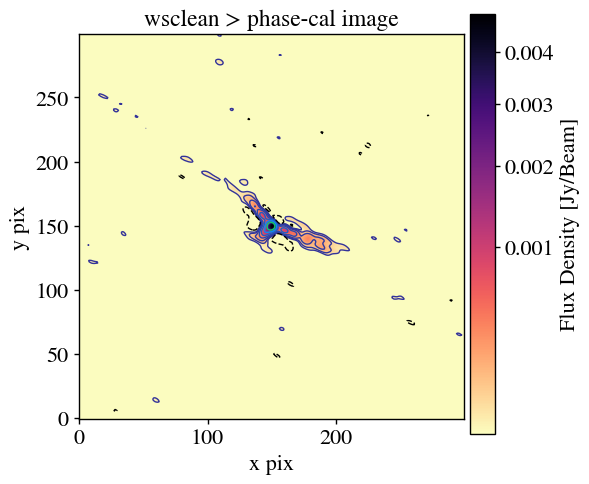

In [15]:
ax = eimshow(do_cutout_2D(ctn(file_list[-1]),box_size=(150,150)),vmin_factor=3,vmax_factor=0.99)
ax.set_title('wsclean > phase-cal image')

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


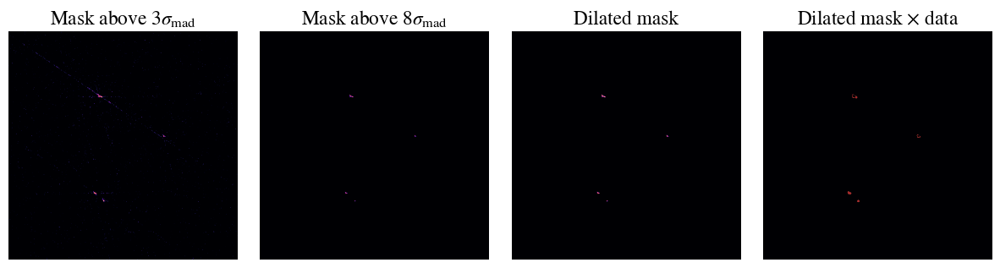

In [17]:
mask = mlibs.mask_dilation(file_list[-1],PLOT=True,sigma=8,iterations=1)[1]
mask_wslclean = mask*1.0 #mask in wsclean is inverted
mask_name = file_list[-1].replace('.fits','') + '_mask.fits'
pf.writeto(mask_name,mask_wslclean,overwrite=True)

In [18]:
mask_name

'/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal_image_phase1_IRAS03359+15.sc_4096x4096_0.05arcsec_10000.briggs...0.0-MFS-image_mask.fits'

In [12]:
%matplotlib inline

In [19]:
steps=['0']

In [20]:
if '0' in steps:
    iteration = '0'
    ############################################################################
    #### 0. Zero interaction. Use a small/negative robust parameter,        ####
    ####    to find the bright/compact emission(s).                         ####
    ############################################################################
    robust = 2.0 #decrease more if lots of failed solutions.
    niter = 10000
    threshold = '20.0e-6Jy'
    start_image(g_name, n_interaction=iteration,
                imsize = imsize, cell = cell,
                # uvtaper=['0.05arcsec'],
                delmodel=True,
                # opt_args=' -multiscale -multiscale-scales 0 ',
                nsigma_automask='12.0',
                nsigma_autothreshold='6.0', # next time probably needs to use 7.0 instead of 3.0
                niter=niter,shift=FIELD_SHIFT,
                # uvtaper='0.04asec',
                savemodel=True,mask = mask_name,
                robust=robust, datacolumn='DATA')


2023-11-06 19:57:47	WARN	calibrater::setvi(bool,bool)	Forcing use of OLD VisibilityIterator.
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2804249 on Snharoco
2023-Nov-06 20:02:28.471832 Process 0 finished.
  2.0
Using mtmfs method.
0_start_image__IRAS03359+15.sc_4096x4096_0.05arcsec_10000.briggs...2.0
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


>> Performing test-gaincal for solint=int...
Found no unflagged data at:   (time=2023/07/28/18:55:04.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:14.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:24.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:25.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:37.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:39.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:47.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:48.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:01.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:03.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:13.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:15.0 field=0 spw=0 cha

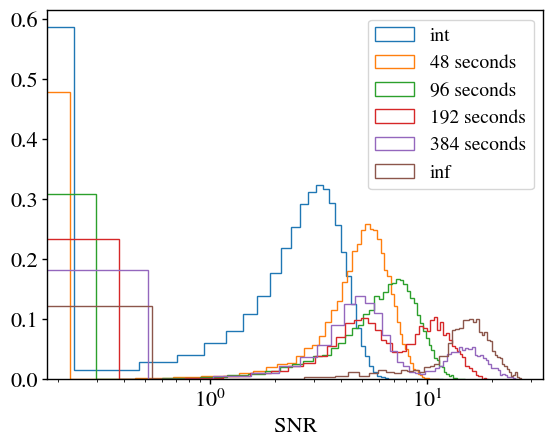

P(<=0.5) = 14.246746746746746  (int)
P(<=0.5) = 10.8341384863124  (48s)
P(<=0.5) = 9.288194444444445  (96s)
P(<=0.5) = 8.950617283950617  (192s)
P(<=0.5) = 9.403935185185185  (384s)
P(<=0.5) = 6.597222222222222  (inf)


<Figure size 640x480 with 0 Axes>

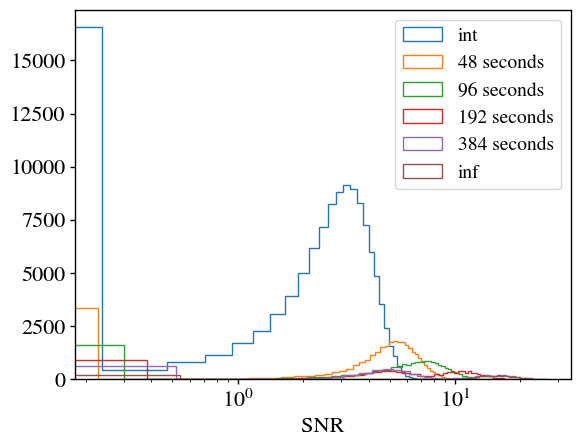

NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


In [21]:
if '0' in steps:
    iteration = '0'
    SNRs,percentiles_SNRs = check_solutions(g_name, field, cut_off=0.5, n_interaction=iteration,
                                            solnorm=solnorm, combine='', calmode='p',
                                            gaintype='G', gain_tables_selfcal=[],return_solution_stats=True)

In [24]:
SNRs

[array([2.67060375, 0.        , 2.42184091, ..., 3.85255933, 0.        ,
        0.        ]),
 array([4.69736242, 0.        , 5.18286943, ..., 4.33589745, 0.        ,
        3.17459106]),
 array([5.27637386, 0.        , 7.82969379, ..., 4.33589745, 0.        ,
        3.17459106]),
 array([ 8.18916035,  6.09139776, 10.88748646, ...,  4.33589745,
         0.        ,  3.17459106]),
 array([12.11221695,  8.68741703, 16.12301064, ...,  4.33589745,
         0.        ,  3.17459106]),
 array([12.93478107,  9.99421024, 16.57250977, ...,  6.27853251,
         0.        ,  7.9327383 ])]

In [25]:
# # Standard solution intervals template.
# time_bins = ['int', '48s', '96s', '192s', '384s','inf']

# # Get SNR values and flagged fractions for each solint.
# # Initial cutoff value
# cutoff = 3.0
# init_fraction = mlibs.scipy.stats.percentileofscore(SNRs[-1], 0.001)
# max_flagged = 10.0  + init_fraction # Maximum fraction of flagged data (10%)
# found_optimal = False
# while not found_optimal and cutoff >= 0.5:
# #     SNR, flagged_data = analyze_SNR(time_bins)

#     for idx, snr_val in enumerate(SNRs):
#         percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)

#         if percentile <= max_flagged:
#             print(f"Optimal SNR: {snr_val} for time bin {time_bins[idx]} seconds.")
#             found_optimal = True
#             break

#     if not found_optimal:
#         cutoff -= 0.5
#         print(f"No SNR meets the condition for less than {max_flagged}% flagged data. Reducing cutoff to {cutoff} and re-running analysis.")

In [27]:
# Your defined time bins
time_bins = ['int', '48s', '96s', '192s', '384s','inf']

summary = flagdata(vis=g_name+'.ms', field='',mode='summary')
init_flags = 100 * summary['flagged'] / summary['total']

# Get SNR values and flagged fractions for each time bin
# SNR, flagged_data = analyze_SNR(time_bins)

# Initial cutoff value
cutoff = 2.0
init_fraction = mlibs.scipy.stats.percentileofscore(SNRs[-1], 0.001)
# max_flagged = 10.0  + 2*init_fraction # Maximum fraction of flagged data (10%)
max_flagged = init_flags - 2*init_fraction
# Finding the optimal SNR that will not flag more than 10% of the data
for idx, snr_val in enumerate(SNRs):
    # print(snr_val)
    percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)
    print(percentile)

    if percentile <= max_flagged:
        print(f"Optimal SNR: {snr_val} for time bin {time_bins[idx]} seconds.")
        break
else:
    print(f"No SNR meets the condition for less than {max_flagged}% flagged data.")

# If no SNR satisfies the condition, reduce the cutoff
if percentile > max_flagged:
    while cutoff >= 0.5:  # Reducing cutoff till 0.5 for extreme cases
        percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)

        if percentile <= max_flagged:
            print(f"Adjusted cutoff to {cutoff} results in <= {max_flagged}% flagged data.")
            break

        cutoff -= 0.5

    if percentile > max_flagged:
        print(f"No cutoff meets the condition for less than {max_flagged}% flagged data, consider other measures.")
        
time_bins[idx]

12.572751322751323
6.012088477366255
Optimal SNR: [5.30546045 4.29115105 4.78644705 ... 4.08040667 1.98791504 5.13937902] for time bin 48s seconds.


'48s'

In [28]:
init_flags - 2*init_fraction

12.112948908840563

In [29]:
# Your defined time bins
time_bins = ['int', '48s', '96s', '192s', '384s','inf']

# Initial cutoff value
cutoff = 2.0
init_fraction = mlibs.scipy.stats.percentileofscore(SNRs[-1], 0.001)
# max_flagged = 10.0  - init_fraction # Maximum fraction of flagged data (10%)
max_flagged = init_flags - 2*init_fraction
found_optimal = False

while not found_optimal and cutoff >= 0.5:
#     SNR, flagged_data = analyze_SNR(time_bins)

    for idx, snr_val in enumerate(SNRs):
        percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)

        if percentile <= max_flagged:
            print(f"Optimal SNR: {snr_val} for time bin {time_bins[idx]} seconds.")
            found_optimal = True
            break

    if not found_optimal:
        cutoff -= 0.5
        print(f"No SNR meets the condition for less than {max_flagged}% flagged data. Reducing cutoff to {cutoff} and re-running analysis.")

if cutoff < 0.5:
    print("Unable to find an optimal SNR within the specified cutoff limits. Consider other measures.")

Optimal SNR: [5.30546045 4.29115105 4.78644705 ... 4.08040667 1.98791504 5.13937902] for time bin 48s seconds.


In [30]:
cutoff

2.0

In [32]:
 time_bins[idx+1]

'96s'

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


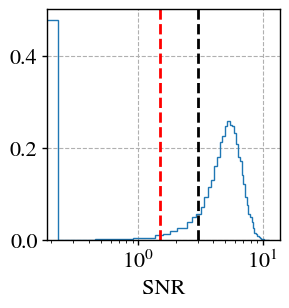

P(<=1.5) = 11.388083735909824  ()


In [25]:
if '0' in steps:
    solint =  '48s'
    gaintype = 'G'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal_temp = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='calculate',
                                        PLOT=False,
                                        gain_tables=[]
                                        )


In [97]:
# flagmanager(vis=g_name+'.ms',mode='restore',versionname='before_selfcal_mode_p')
# statwt(vis=g_vis, statalg='chauvenet',timebin='60s',datacolumn='data')

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


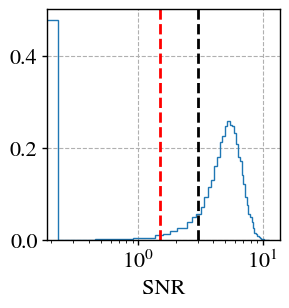

P(<=1.5) = 11.388083735909824  ()
     => Creating new flagbackup file before mode  p  selfcal ...
     => Reporting data flagged before selfcal apply interaction 0 ...
field IRAS03359+15:  36.4 percent flagged
     => Reporting data flagged after selfcal apply interaction 0 ...
field IRAS03359+15:  37.2 percent flagged


In [28]:
if '0' in steps:
    solint =  '48s'
    gaintype = 'G'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal_temp = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='apply',
                                        PLOT=True,
                                        gain_tables=[]
                                        )


In [29]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

In [30]:
# split(vis=g_vis,outputvis=g_name+'.selfcalibrated_pinfT.ms',datacolumn='corrected')

In [31]:
# niter = 150000
# robust = 0.5
# run_wsclean(g_name+'.selfcalibrated_pinfT.ms', robust = robust,
#             imsize = imsize, cell = cell,base_name='selfcal_test',
#             nsigma_automask='3.0',nsigma_autothreshold='1.5',
#             n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
#             datacolumn='DATA',
#             # uvtaper=['0.08arcsec'],
#             niter=niter,
#             PLOT=False)


In [35]:
niter = 150000
robust = 0.5
run_wsclean(g_name, robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_test',
            nsigma_automask='8.0',nsigma_autothreshold='3.0',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
            datacolumn='CORRECTED_DATA',
            # uvtaper=['0.08arcsec'],
            niter=niter,shift=FIELD_SHIFT,
            PLOT=False)


  0.5
Using mtmfs method.
selfcal_test_IRAS03359+15.sc_4096x4096_0.05arcsec_150000.briggs...0.5
Skipping imaging; already done.


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [37]:
# run_rflag(g_vis,display='report',action='apply',
#           timedevscale=3.0,freqdevscale=3.0,winsize=7,datacolumn = 'corrected')

In [106]:
niter = 150000
robust = 0.0
run_wsclean(g_name, robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_test_after_rflag',
            nsigma_automask='7.0',nsigma_autothreshold='4.0',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
            datacolumn='CORRECTED_DATA',
            # uvtaper=['0.08arcsec'],
            niter=niter,shift=FIELD_SHIFT,
            PLOT=False)


Invalid MIT-MAGIC-COOKIE-1 keyInvalid MIT-MAGIC-COOKIE-1 keyInvalid MIT-MAGIC-COOKIE-1 key

Node 0, PID 1626770 on Snharoco
2023-Nov-06 13:47:03.073784 Process 0 finished.
  0.0
Using mtmfs method.
selfcal_test_after_rflag_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_150000.briggs...0.0
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [41]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal_image_phase1_IRAS03359+15.sc_4096x4096_0.05arcsec_10000.briggs...0.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/0_start_image__IRAS03359+15.sc_4096x4096_0.05arcsec_10000.briggs...2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal_test_IRAS03359+15.sc_4096x4096_0.05arcsec_150000.briggs...0.5-MFS-image.fits']

  >> Center -->  2922 1624
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > phase-cal image')

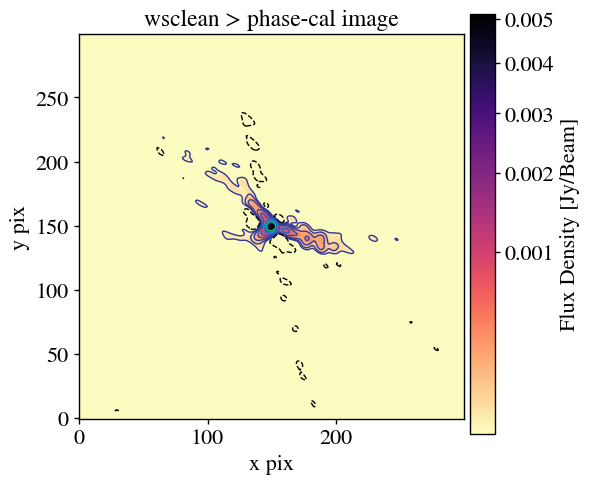

In [42]:
ax = eimshow(do_cutout_2D(ctn(file_list[-1]),box_size=(150,150)),vmin_factor=3,vmax_factor=0.99)
ax.set_title('wsclean > phase-cal image')

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


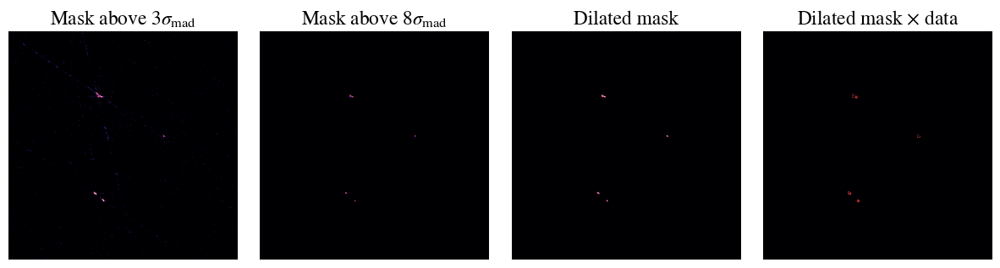

In [45]:
mask = mlibs.mask_dilation(file_list[-1],PLOT=True,sigma=8,iterations=1)[1]
mask_wslclean = mask*1.0 #mask in wsclean is inverted
mask_name = file_list[-1].replace('.fits','') + '_mask.fits'
pf.writeto(mask_name,mask_wslclean,overwrite=True)

In [40]:
%matplotlib inline

In [17]:
niter = 150000
robust = -0.5
run_wsclean(g_name, robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_test',
            nsigma_automask='20.0',nsigma_autothreshold='2.0',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
            datacolumn='CORRECTED_DATA',
            # uvtaper=['0.08arcsec'],
            niter=niter,shift=FIELD_SHIFT,
            PLOT=False)


Invalid MIT-MAGIC-COOKIE-1 keyInvalid MIT-MAGIC-COOKIE-1 keyInvalid MIT-MAGIC-COOKIE-1 key

Node 0, PID 1802858 on Snharoco
2023-Nov-06 14:10:37.936225 Process 0 finished.
  -0.5
Using mtmfs method.
selfcal_test_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_150000.briggs...-0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [47]:
steps=['1']

In [56]:
if '1' in steps:
    iteration = '1'
    ############################################################################
    #### 1. First interaction. Increase a little the robust parameter,      ####
    ####    start to consider more extended emission.                       ####
    ############################################################################
    niter = 50000
    robust = 0.5
    
    run_wsclean(g_name, robust = robust,
                imsize = imsize, cell = cell,
                nsigma_automask='8.0',nsigma_autothreshold='2.0',
                n_interaction=iteration,savemodel=True,quiet=True,with_multiscale=False,
                datacolumn='CORRECTED_DATA',mask=mask_name,shift=FIELD_SHIFT,
                # uvtaper=['0.08arcsec'],
                niter=niter,
                PLOT=False)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2915452 on Snharoco
2023-Nov-06 21:20:34.870251 Process 0 finished.
  0.5
Using mtmfs method.
1_update_model_image__IRAS03359+15.sc_4096x4096_0.05arcsec_50000.briggs...0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [57]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

>> Performing test-gaincal for solint=int...
Found no unflagged data at:   (time=2023/07/28/18:55:04.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:14.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:24.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:25.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:37.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:39.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:47.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:48.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:01.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:03.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:13.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:15.0 field=0 spw=0 cha

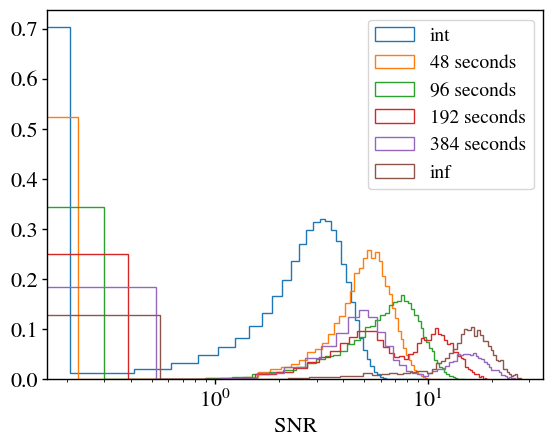

P(<=1.5) = 20.547899103101283  (int)
P(<=1.5) = 12.043512043512044  (48s)
P(<=1.5) = 10.548008823870893  (96s)
P(<=1.5) = 9.889470622454915  (192s)
P(<=1.5) = 9.959171770195393  (384s)
P(<=1.5) = 7.1469907407407405  (inf)


<Figure size 640x480 with 0 Axes>

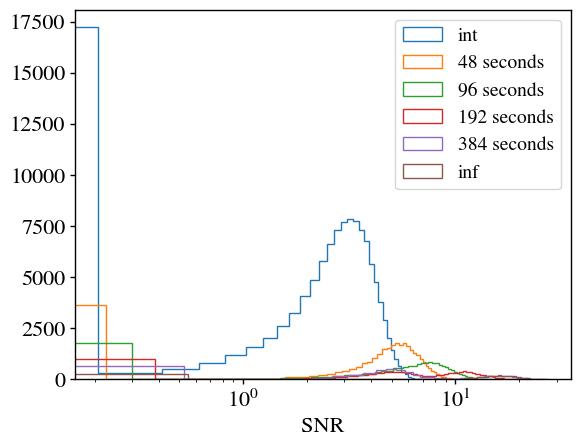

NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


In [58]:
if '1' in steps:
    iteration = '1'
    SNRs,percentiles_SNRs = check_solutions(g_name, field, cut_off=1.5, n_interaction=iteration,
                                            solnorm=solnorm, combine='', calmode='p',
                                            gaintype='G', 
                                            gain_tables_selfcal=gain_tables_selfcal_temp,
                                            return_solution_stats=True)

In [59]:
percentiles_SNRs

array([20.5478991 , 12.04351204, 10.54800882,  9.88947062,  9.95917177,
        7.14699074])

In [53]:
# Your defined time bins
time_bins = ['int', '48s', '96s', '192s', '384s','inf']

summary = flagdata(vis=g_name+'.ms', field='',mode='summary')
init_flags = 100 * summary['flagged'] / summary['total']

# Get SNR values and flagged fractions for each time bin
# SNR, flagged_data = analyze_SNR(time_bins)

# Initial cutoff value
cutoff = 2.0
init_fraction = mlibs.scipy.stats.percentileofscore(SNRs[-1], 0.001)
# max_flagged = 10.0  + 2*init_fraction # Maximum fraction of flagged data (10%)
max_flagged = init_flags - 2*init_fraction
# Finding the optimal SNR that will not flag more than 10% of the data
for idx, snr_val in enumerate(SNRs):
    # print(snr_val)
    percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)
    print(percentile)

    if percentile <= max_flagged:
        print(f"Optimal SNR: {snr_val} for time bin {time_bins[idx]} seconds.")
        break
else:
    print(f"No SNR meets the condition for less than {max_flagged}% flagged data.")

# If no SNR satisfies the condition, reduce the cutoff
if percentile > max_flagged:
    while cutoff >= 0.5:  # Reducing cutoff till 0.5 for extreme cases
        percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)

        if percentile <= max_flagged:
            print(f"Adjusted cutoff to {cutoff} results in <= {max_flagged}% flagged data.")
            break

        cutoff -= 0.5

    if percentile > max_flagged:
        print(f"No cutoff meets the condition for less than {max_flagged}% flagged data, consider other measures.")
        
time_bins[idx]

39.57506613756613
9.628986625514404
Optimal SNR: [3.26204491 2.55976415 1.88599455 ... 2.72992277 0.         2.24939632] for time bin 48s seconds.


'48s'

In [54]:
init_flags - 3*init_fraction

7.730150358629363

In [55]:
# Your defined time bins
time_bins = ['int', '48s', '96s', '192s', '384s','inf']

# Initial cutoff value
cutoff = 1.5
init_fraction = mlibs.scipy.stats.percentileofscore(SNRs[-1], 0.001)
# max_flagged = 10.0  - init_fraction # Maximum fraction of flagged data (10%)
max_flagged = init_flags - 2*init_fraction
found_optimal = False

while not found_optimal and cutoff >= 0.5:
#     SNR, flagged_data = analyze_SNR(time_bins)

    for idx, snr_val in enumerate(SNRs):
        percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)

        if percentile <= max_flagged:
            print(f"Optimal SNR: {snr_val} for time bin {time_bins[idx]} seconds.")
            found_optimal = True
            break

    if not found_optimal:
        cutoff -= 0.5
        print(f"No SNR meets the condition for less than {max_flagged}% flagged data. Reducing cutoff to {cutoff} and re-running analysis.")

if cutoff < 0.5:
    print("Unable to find an optimal SNR within the specified cutoff limits. Consider other measures.")

Optimal SNR: [3.26204491 2.55976415 1.88599455 ... 2.72992277 0.         2.24939632] for time bin 48s seconds.


In [42]:
def estimate_solint(SNRs):
    # Your defined time bins
    time_bins = ['int', '48s', '96s', '192s', '384s','inf']

    # Initial cutoff value
    cutoff = 3.0
    init_fraction = mlibs.scipy.stats.percentileofscore(SNRs[-1], 0.001)
    max_flagged = 25.0  + init_fraction # Maximum fraction of flagged data (10%)

    found_optimal = False

    while not found_optimal and cutoff >= 0.5:
    #     SNR, flagged_data = analyze_SNR(time_bins)

        for idx, snr_val in enumerate(SNRs):
            percentile = mlibs.scipy.stats.percentileofscore(SNRs[idx], cutoff)

            if percentile <= max_flagged:
                print(f"Optimal SNR: {snr_val} for time bin {time_bins[idx]} seconds.")
                found_optimal = True
#                 return(time_bins[idx],cutoff)
                break

        if not found_optimal:
            cutoff -= 0.5
            print(f"No SNR meets the condition for less than {max_flagged}% flagged data. Reducing cutoff to {cutoff} and re-running analysis.")

    if cutoff < 0.5:
        print("Unable to find an optimal SNR within the specified cutoff limits. Consider other measures.")
    return(time_bins[idx],cutoff)

In [44]:
# solint, cutoff = estimate_solint(SNRs)

In [53]:
solint

'48s'

In [60]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

3 of 46 solutions flagged due to SNR < 1.5 in spw=15 at 2023/07/28/19:01:38.1
1 of 42 solutions flagged due to SNR < 1.5 in spw=16 at 2023/07/28/19:01:38.3
2 of 18 solutions flagged due to SNR < 1.5 in spw=17 at 2023/07/28/18:56:53.0
4 of 32 solutions flagged due to SNR < 1.5 in spw=17 at 2023/07/28/18:58:31.3
3 of 10 solutions flagged due to SNR < 1.5 in spw=17 at 2023/07/28/19:00:46.1
 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/28/19:01:28.0 field=0 spw=17 chan=0)
1 of 44 solutions flagged due to SNR < 1.5 in spw=19 at 2023/07/28/19:01:35.8
1 of 50 solutions flagged due to SNR < 1.5 in spw=24 at 2023/07/28/18:55:32.5
1 of 52 solutions flagged due to SNR < 1.5 in spw=24 at 2023/07/28/19:01:37.9
1 of 52 solutions flagged due to SNR < 1.5 in spw=25 at 2023/07/28/19:01:37.8
1 of 52 solutions flagged due to SNR < 1.5 in spw=27 at 2023/07/28/19:00:07.3
1 of 42 solutions flagged due to SNR < 1.5 in spw=29 at 2023/07/28/18:56:58.2
1 of 38 solutions flagged d

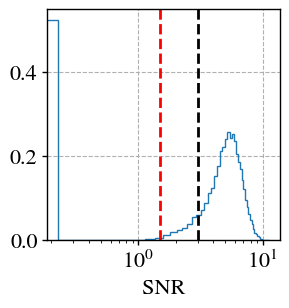

P(<=1.5) = 12.043512043512044  ()


In [61]:
if '1' in steps:
    solint = '48s'
    gaintype = 'G'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal_temp = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='calculate',
                                        PLOT=False,
                                        # uvrange='>100klambda',
                                        gain_tables=gain_tables_selfcal_temp
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


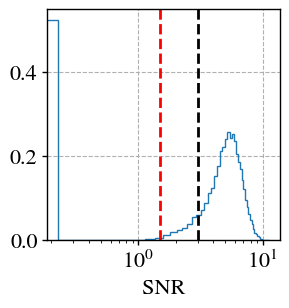

P(<=1.5) = 12.043512043512044  ()
     => Creating new flagbackup file before mode  p  selfcal ...


2023-11-06 21:23:31	WARN	flagmanager::::casa	Version name 'before_selfcal_mode_p' already exist. Will rename it to before_selfcal_mode_p.old.1699305810


     => Reporting data flagged before selfcal apply interaction 1 ...
field IRAS03359+15:  37.2 percent flagged
     => Reporting data flagged after selfcal apply interaction 1 ...
field IRAS03359+15:  38.0 percent flagged


In [63]:
if '1' in steps:
    solint = '48s'
    gaintype = 'G'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal_temp = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='apply',
                                        PLOT=True,
                                        # uvrange='>100klambda',
                                        gain_tables=gain_tables_selfcal_temp
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

In [64]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/1_selfcal_phase_incremental_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


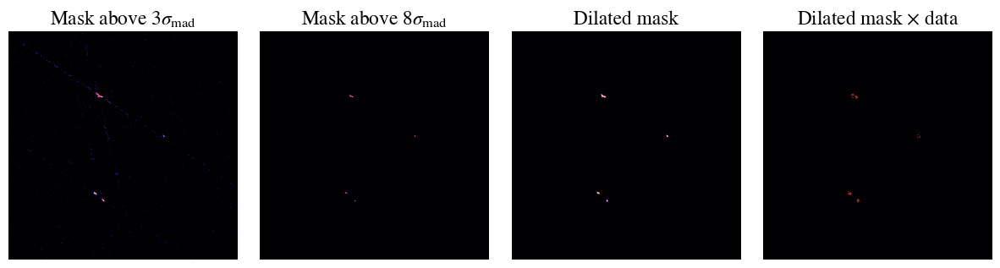

In [68]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

res_list = glob.glob(f"{path}*MFS-residual.fits")
res_list.sort(key=os.path.getmtime, reverse=False)
res_list

mask = mlibs.mask_dilation(file_list[-1],PLOT=True,sigma=8,iterations=2,
#                           rms=mlibs.mad_std(ctn(res_list[-1]))
                          )[1]
mask_wslclean = mask*1.0 #mask in wsclean is inverted
mask_name = file_list[-1].replace('.fits','') + '_mask.fits'
pf.writeto(mask_name,mask_wslclean,overwrite=True)

In [69]:
%matplotlib inline

  >> Center -->  2922 1624
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > phase-cal image')

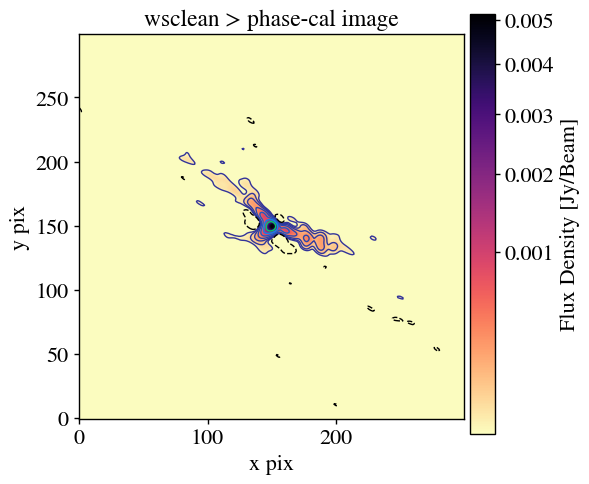

In [70]:
ax = eimshow(do_cutout_2D(ctn(file_list[-1]),box_size=(150,150)),vmin_factor=3,vmax_factor=0.99)
ax.set_title('wsclean > phase-cal image')

In [73]:
steps = ['2']

In [74]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/1_selfcal_phase_incremental_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

In [75]:
if '2' in steps:
    iteration = '2'
    ############################################################################
    #### 2. Second interaction. Increase more the robust parameter, or use  ####
    ####    uvtapering. Consider even more extended emission (if there is). ####
    ############################################################################
    niter = 50000
    robust = 0.5
    
    run_wsclean(g_name, robust = robust,
                imsize = imsize, cell = cell,
                nsigma_automask='6.0',nsigma_autothreshold='2.0',
                n_interaction=iteration,savemodel=True,quiet=True,with_multiscale=False,
                datacolumn='CORRECTED_DATA',mask = mask_name,
                   # uvtaper=['0.08arcsec'],
                niter=niter,shift=FIELD_SHIFT,
                PLOT=False)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2952344 on Snharoco
2023-Nov-06 21:31:17.412573 Process 0 finished.
  0.5
Using mtmfs method.
2_update_model_image__IRAS03359+15.sc_4096x4096_0.05arcsec_50000.briggs...0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [83]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/1_selfcal_phase_incremental_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

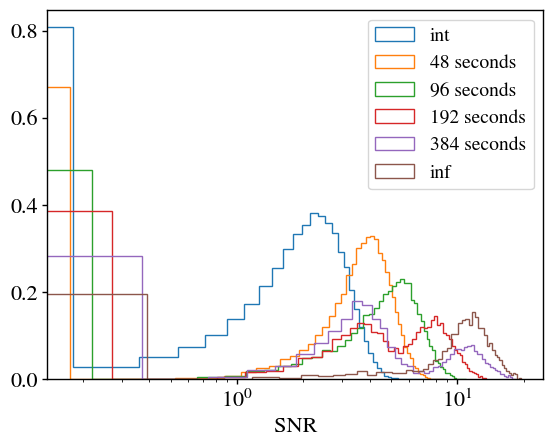

P(<=0.5) = 15.639083731489954  (int)
P(<=0.5) = 11.738193219674702  (48s)
P(<=0.5) = 10.544456128052342  (96s)
P(<=0.5) = 10.432421950746559  (192s)
P(<=0.5) = 10.454943132108488  (384s)
P(<=0.5) = 7.581018518518518  (inf)


<Figure size 640x480 with 0 Axes>

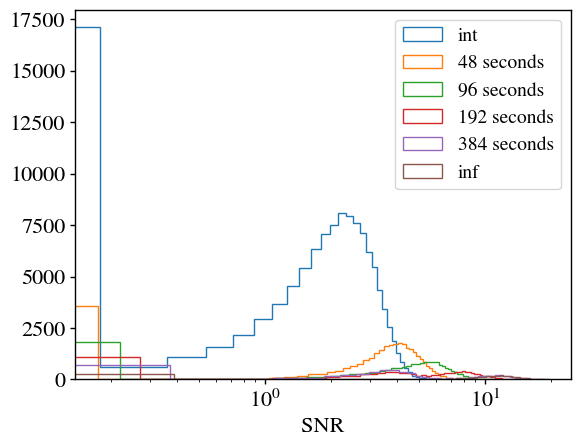

NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


Found no unflagged data at:   (time=2023/07/19/07:12:55.0 field=0 spw=28 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:01.0 field=0 spw=28 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:07.0 field=0 spw=28 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:13.0 field=0 spw=28 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:19.0 field=0 spw=28 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:25.0 field=0 spw=28 chan=0)
 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/19/07:13:33.0 field=0 spw=28 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:12:55.0 field=0 spw=29 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:01.0 field=0 spw=29 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:07.0 field=0 spw=29 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:13.0 field=0 spw=29 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:19.0 field=0 spw=29 ch

Found no unflagged data at:   (time=2023/07/19/07:12:55.0 field=0 spw=37 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:01.0 field=0 spw=37 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:07.0 field=0 spw=37 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:13.0 field=0 spw=37 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:19.0 field=0 spw=37 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:25.0 field=0 spw=37 chan=0)
 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/19/07:13:33.0 field=0 spw=37 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:12:55.0 field=0 spw=38 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:01.0 field=0 spw=38 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:07.0 field=0 spw=38 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:13.0 field=0 spw=38 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:19.0 field=0 spw=38 ch

Found no unflagged data at:   (time=2023/07/19/07:12:55.0 field=0 spw=51 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:01.0 field=0 spw=51 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:07.0 field=0 spw=51 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:13.0 field=0 spw=51 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:19.0 field=0 spw=51 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:25.0 field=0 spw=51 chan=0)
 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/19/07:13:33.0 field=0 spw=51 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:12:55.0 field=0 spw=52 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:01.0 field=0 spw=52 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:07.0 field=0 spw=52 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:13.0 field=0 spw=52 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:19.0 field=0 spw=52 ch

 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/19/07:14:23.8 field=0 spw=63 chan=0)
 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/19/07:14:47.0 field=0 spw=63 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:12:55.0 field=0 spw=64 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:01.0 field=0 spw=64 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:07.0 field=0 spw=64 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:13.0 field=0 spw=64 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:19.0 field=0 spw=64 chan=0)
Found no unflagged data at:   (time=2023/07/19/07:13:25.0 field=0 spw=64 chan=0)
 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/19/07:13:33.0 field=0 spw=64 chan=0)
 Insufficient unflagged antennas to proceed with this solve.
   (time=2023/07/19/07:13:37.0 field=0 spw=64 chan=0)
 Insufficient unflagged antennas to proceed with this 

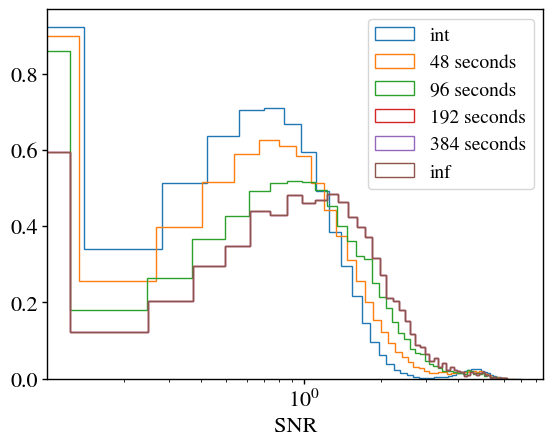

P(<=0.5) = 29.81683271823747  (int)
P(<=0.5) = 25.742669753086417  (48s)
P(<=0.5) = 20.91531635802469  (96s)
P(<=0.5) = 15.258487654320987  (192s)
P(<=0.5) = 15.258487654320987  (384s)
P(<=0.5) = 15.258487654320987  (inf)


<Figure size 640x480 with 0 Axes>

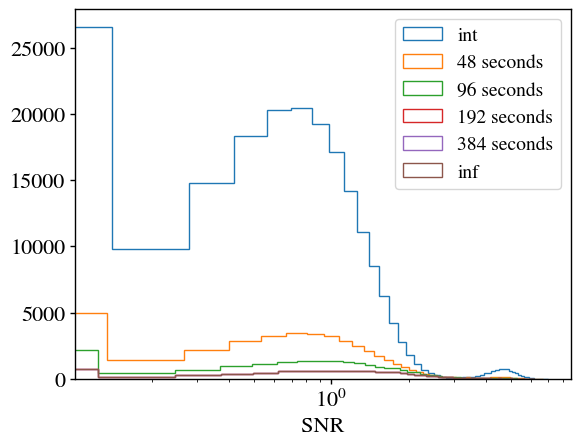

NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


In [78]:
if '2' in steps:
    iteration = '2'
    SNRs,percentiles_SNRs = check_solutions(g_name, field, cut_off=0.5, n_interaction=iteration,
                                            solnorm=solnorm, combine='', calmode='ap',
                                            gaintype='G', gain_tables_selfcal=gain_tables_selfcal_temp,
                                                return_solution_stats=True)

In [84]:
percentiles_SNRs

array([15.63908373, 11.73819322, 10.54445613, 10.43242195, 10.45494313,
        7.58101852])

In [85]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/1_selfcal_phase_incremental_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


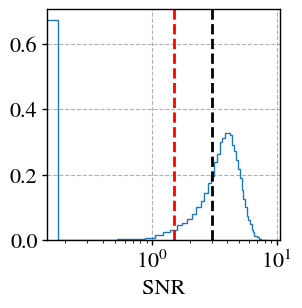

P(<=1.5) = 13.057678489777256  ()


In [86]:
if '2' in steps:
    solint = '48s'
    gaintype = 'G'
    calmode = 'ap'
    minblperant = 4
    gain_tables_selfcal_temp = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='calculate',
                                        PLOT=False,
                                        gain_tables=gain_tables_selfcal_temp
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


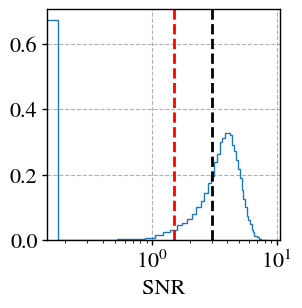

P(<=1.5) = 13.057678489777256  ()
     => Creating new flagbackup file before mode  ap  selfcal ...
     => Reporting data flagged before selfcal apply interaction 2 ...
field IRAS03359+15:  38.0 percent flagged
     => Reporting data flagged after selfcal apply interaction 2 ...
field IRAS03359+15:  39.4 percent flagged


In [87]:
if '2' in steps:
    solint = '48s'
    gaintype = 'G'
    calmode = 'ap'
    minblperant = 4
    gain_tables_selfcal_temp = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='apply',
                                        PLOT=True,
                                        gain_tables=gain_tables_selfcal_temp
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

In [91]:
gain_tables_selfcal_temp

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/0_selfcal_phase_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/1_selfcal_phase_incremental_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T/selfcal/2_selfcal_ampphase_incremental_IRAS03359+15.sc__solint_48s_minsnr_1.5_combine_gtype_G.tb']

In [89]:
split(vis=g_vis,outputvis=g_name+'.selfcalibrated_p48G-p48G-ap48G.ms',datacolumn='corrected')

In [90]:
niter = 150000
robust = 0.5
run_wsclean(g_name+'.selfcalibrated_p48G-p48G-ap48G.ms', robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_image_trial1',
            nsigma_automask='6.0',nsigma_autothreshold='2.0',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
            datacolumn='DATA',shift=FIELD_SHIFT,
            # uvtaper=['0.08arcsec'],
            niter=niter,
            PLOT=False)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2996133 on Snharoco
2023-Nov-06 21:52:23.492710 Process 0 finished.
  0.5
Using mtmfs method.
selfcal_image_trial1_IRAS03359+15.sc.selfcalibrated_p48G-p48G-ap48G_4096x4096_0.05arcsec_150000.briggs...0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [41]:
plotms(vis=g_vis,xaxis='uvwave',yaxis='amp',ydatacolumn='corrected',avgtime='9999',avgantenna=True)

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


In [42]:
niter = 150000
robust = -1.0
run_wsclean(g_name+'.selfcalibrated_tp48G-p36G-ap36G.ms', robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_image_trial1',
            nsigma_automask='15.0',nsigma_autothreshold='1.5',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
            datacolumn='DATA',shift=FIELD_SHIFT,
            # uvtaper=['0.08arcsec'],
            niter=niter,
            PLOT=False)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2387502 on Snharoco
2023-Nov-06 16:39:58.842186 Process 0 finished.
  -1.0
Using mtmfs method.
selfcal_image_trial1_IRAS03359+15.calibrated.avg12s.selfcalibrated_tp48G-p36G-ap36G_4096x4096_0.05arcsec_150000.briggs...-1.0
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [53]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/FOV_phasecal_image_IRAS03359+15.calibrated.avg12s_7168x7168_0.1arcsec_10000.briggs...0.5-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/FOV_phasecal_image_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...0.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/0_start_image__IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...0.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal_test_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_150000.briggs...0.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal_test_after_rflag_IR

In [54]:
mask = mlibs.mask_dilation(file_list[-1],PLOT=True,sigma=40,iterations=1)[1]
mask_wslclean = mask*1.0 #mask in wsclean is inverted
mask_name = file_list[-1].replace('.fits','') + '_mask.fits'
pf.writeto(mask_name,mask_wslclean,overwrite=True)




No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


In [52]:

niter = 150000
robust = -1.5
run_wsclean(g_name+'.selfcalibrated_tp48G-p36G-ap36G.ms', robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_image_trial1',
            nsigma_automask='3.0',nsigma_autothreshold='1.5',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
            datacolumn='DATA',shift=FIELD_SHIFT,mask=mask_name,
            # uvtaper=['0.08arcsec'],
            niter=niter,
            PLOT=False)

Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2403824 on Snharoco
2023-Nov-06 16:51:59.109806 Process 0 finished.
  -1.5
Using mtmfs method.
selfcal_image_trial1_IRAS03359+15.calibrated.avg12s.selfcalibrated_tp48G-p36G-ap36G_4096x4096_0.05arcsec_150000.briggs...-1.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [47]:
ax = eimshow(ctn(file_list[0]),vmin_factor=3,vmax_factor=0.1,figsize=(10,5))


Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


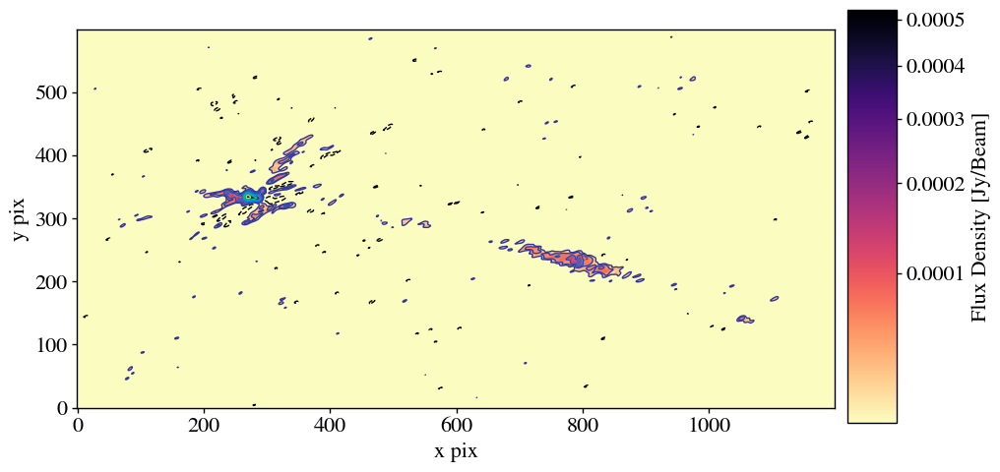

In [93]:
ax = eimshow(do_cutout_2D(ctn(file_list[0]),center=(1050,1000),box_size=(300,600)),vmin_factor=3,vmax_factor=0.9,figsize=(10,5))
# ax.set_title('wsclean > start image')

Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


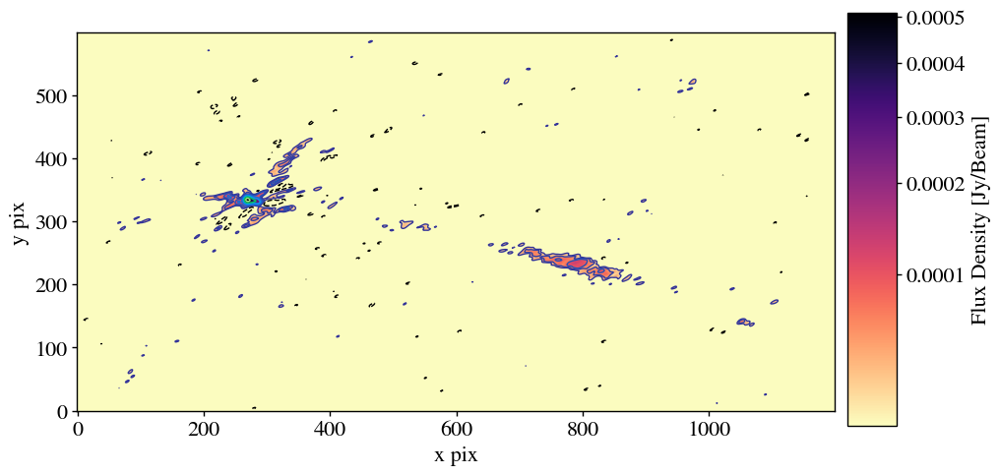

In [94]:
ax = eimshow(do_cutout_2D(ctn(file_list[1]),center=(1050,1000),box_size=(300,600)),vmin_factor=3,vmax_factor=0.9,figsize=(10,5))


Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


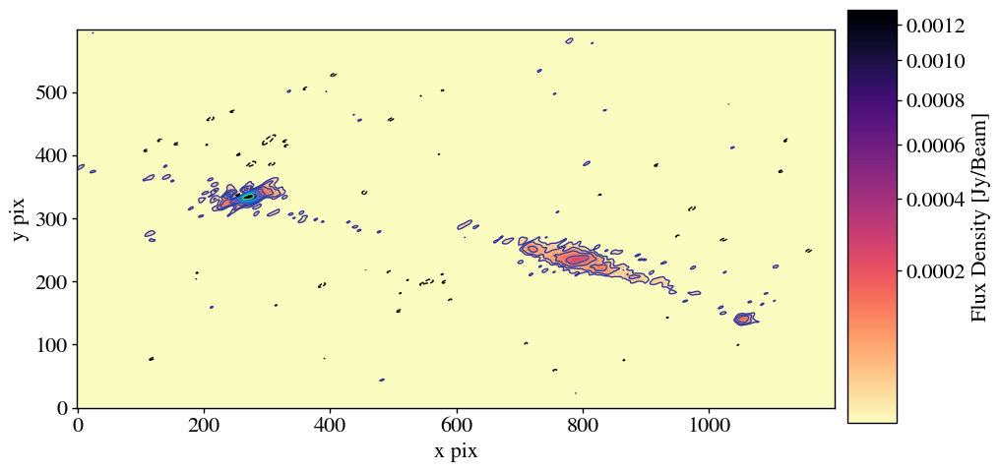

In [95]:
ax = eimshow(do_cutout_2D(ctn(file_list[2]),center=(1050,1000),box_size=(300,600)),vmin_factor=3,vmax_factor=0.9,figsize=(10,5))


Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


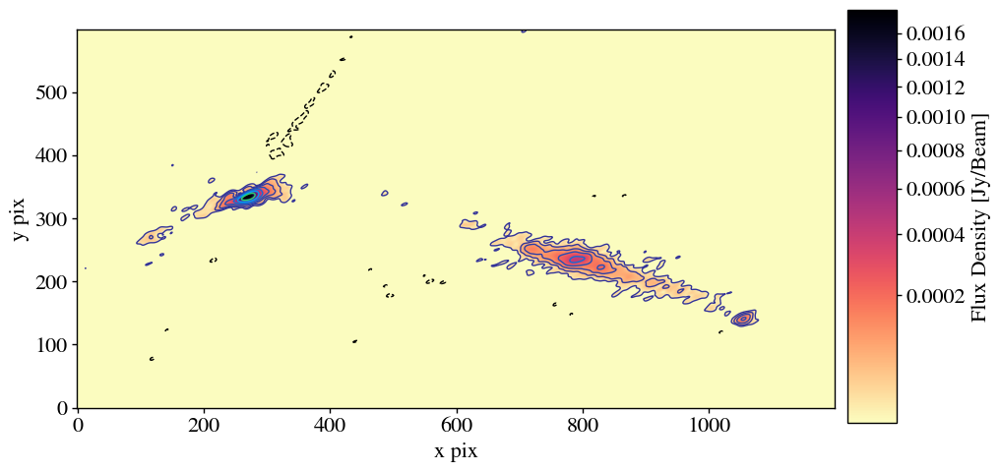

In [96]:
ax = eimshow(do_cutout_2D(ctn(file_list[3]),center=(1050,1000),box_size=(300,600)),vmin_factor=3,vmax_factor=0.9,figsize=(10,5))


Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


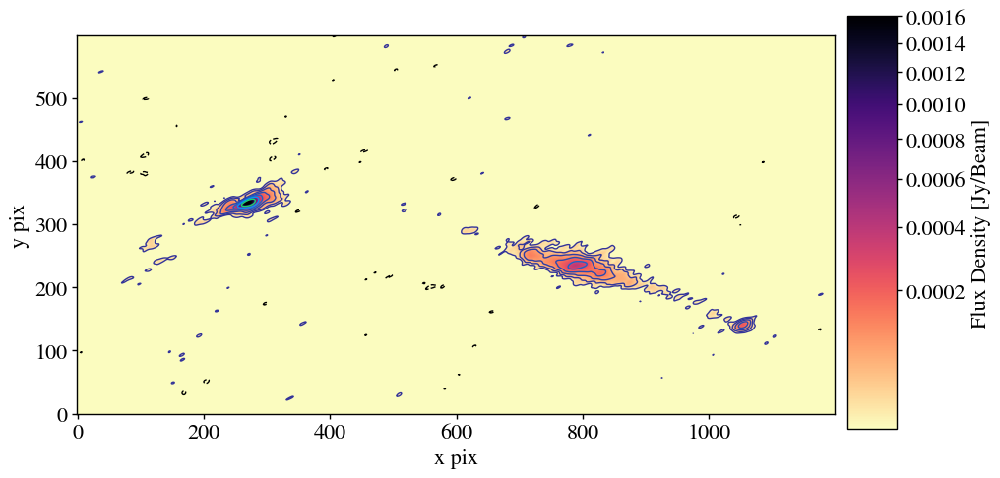

In [100]:
ax = eimshow(do_cutout_2D(ctn(file_list[4]),center=(1050,1000),box_size=(300,600)),vmin_factor=3,vmax_factor=0.9,figsize=(10,5))


In [7]:
ax = eimshow(do_cutout_2D(ctn(file_list[5]),center=(1050,1000),box_size=(300,600)),vmin_factor=3,vmax_factor=0.9,figsize=(10,5))


NameError: name 'file_list' is not defined

In [107]:
# ax = mlibs.eimshow(file_list[4],crop=True, box_size=600,vmin_factor=3,vmax_factor=0.9,figsize=(10,5))


## FInal Self-Cal gain tables

In [83]:
run_rflag(g_vis,display='report',action='apply',
          timedevscale=3.0,freqdevscale=3.0,winsize=7,datacolumn = 'corrected')

Flag statistics before rflag:
field IRAS03359+15:  26.1 percent flagged


2023-11-06 18:39:25	WARN	flagmanager::::casa	Version name 'seflcal_before_rflag' already exist. Will rename it to seflcal_before_rflag.old.1699295965
2023-11-06 18:39:26	WARN	flagdata::::casa	Disabling savepars for the display
2023-11-06 18:40:33	WARN	flagmanager::::casa	Version name 'seflcal_after_rflag' already exist. Will rename it to seflcal_after_rflag.old.1699296033
....10....20....30....40....50....60....70....80....90....100%


Flag statistics after rflag:
field IRAS03359+15:  30.1 percent flagged


In [87]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/phasecal_image_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-1.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/phasecal_image_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/0_start_image__IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal_test_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_150000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/1_update_model_image__IRAS0335

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


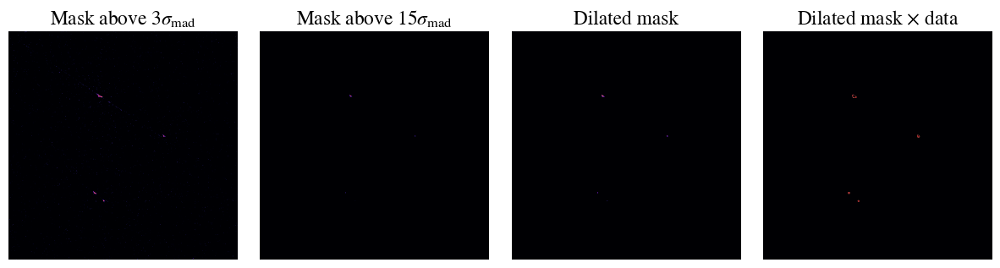

In [88]:
mask = mlibs.mask_dilation(file_list[-1],PLOT=True,sigma=15,iterations=1)[1]
mask_wslclean = mask*1.0 #mask in wsclean is inverted
mask_name = file_list[-1].replace('.fits','') + '_mask.fits'
pf.writeto(mask_name,mask_wslclean,overwrite=True)

In [89]:
steps = ['3']

In [90]:
if '3' in steps:
    iteration = '3'
    ############################################################################
    #### 3. Third interaction. Increase more the robust parameter, or use  ####
    ####    uvtapering. Consider even more extended emission (if there is). ####
    ############################################################################
    niter = 100000
    robust = -0.5
    
    run_wsclean(g_name, robust = robust,
                imsize = imsize, cell = cell,
                nsigma_automask='15.0',nsigma_autothreshold='1.0',
                n_interaction=iteration,savemodel=True,quiet=True,with_multiscale=False,
                datacolumn='CORRECTED_DATA',mask = mask_name,
                #    uvtaper=['0.04arcsec'],
                niter=niter,shift=FIELD_SHIFT,
                PLOT=True)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2633838 on Snharoco
2023-Nov-06 18:47:42.599172 Process 0 finished.
  -0.5
Using mtmfs method.
3_update_model_image__IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_100000.briggs...-0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


>> Performing test-gaincal for solint=int...
Found no unflagged data at:   (time=2023/07/28/18:55:04.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:14.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:24.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:25.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:37.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:39.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:47.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:48.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:01.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:03.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:13.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:15.0 field=0 spw=0 cha

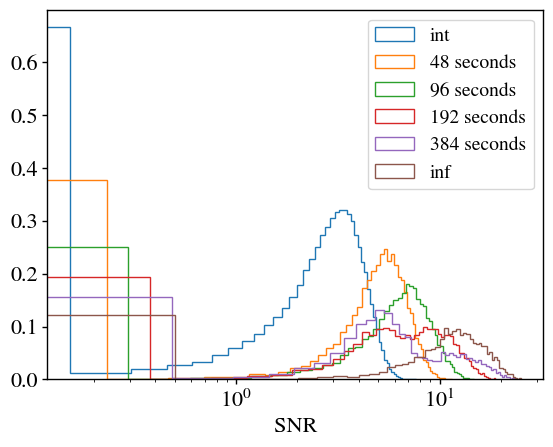

P(<=3.0) = 48.40360449735449  (int)
P(<=3.0) = 14.033564814814815  (48s)
P(<=3.0) = 10.50925925925926  (96s)
P(<=3.0) = 10.32986111111111  (192s)
P(<=3.0) = 11.458333333333334  (384s)
P(<=3.0) = 6.568287037037037  (inf)


<Figure size 640x480 with 0 Axes>

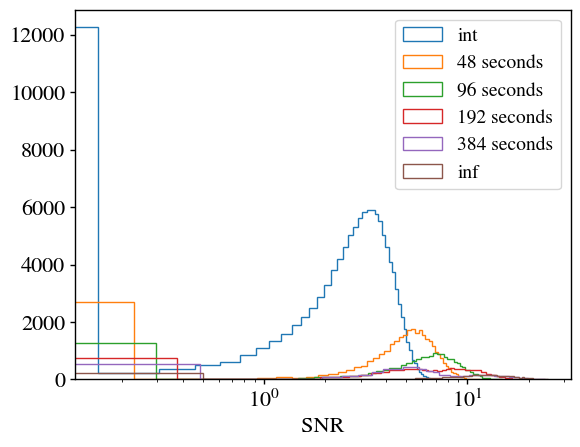

NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


In [91]:
if '3' in steps:
    iteration = '3'
    SNRs,percentiles_SNRs = check_solutions(g_name, field, cut_off=3.0, n_interaction=iteration,
                                            solnorm=solnorm, combine='', calmode='p',
                                            gaintype='G', gain_tables_selfcal=[],
                                            return_solution_stats=True)

1 of 52 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/18:55:52.8
1 of 46 solutions flagged due to SNR < 1.5 in spw=16 at 2023/07/28/19:01:40.5
1 of 26 solutions flagged due to SNR < 1.5 in spw=17 at 2023/07/28/18:55:57.3
1 of 28 solutions flagged due to SNR < 1.5 in spw=17 at 2023/07/28/19:00:39.0
1 of 48 solutions flagged due to SNR < 1.5 in spw=19 at 2023/07/28/18:55:58.4
1 of 52 solutions flagged due to SNR < 1.5 in spw=21 at 2023/07/28/19:00:32.6
2 of 52 solutions flagged due to SNR < 1.5 in spw=26 at 2023/07/28/18:58:57.7
1 of 50 solutions flagged due to SNR < 1.5 in spw=27 at 2023/07/28/18:55:57.2
2 of 48 solutions flagged due to SNR < 1.5 in spw=27 at 2023/07/28/19:01:41.0
2 of 50 solutions flagged due to SNR < 1.5 in spw=29 at 2023/07/28/18:55:55.9
1 of 50 solutions flagged due to SNR < 1.5 in spw=30 at 2023/07/28/19:01:40.8
2 of 40 solutions flagged due to SNR < 1.5 in spw=31 at 2023/07/28/18:55:57.8
3 of 38 solutions flagged due to SNR < 1.5 in spw=31 at 2023/07/2

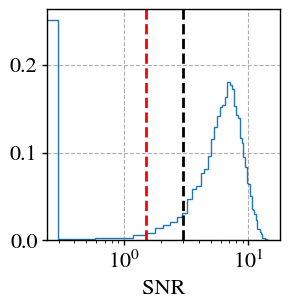

P(<=1.5) = 7.777777777777778  ()


In [95]:
if '3' in steps:
    solint = '96s'
    gaintype = 'G'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='calculate',
                                        PLOT=True,
                                        gain_tables=[]
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


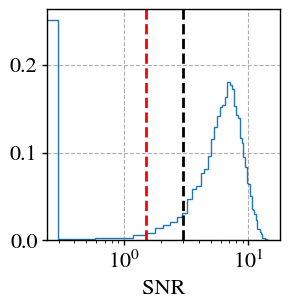

P(<=1.5) = 7.777777777777778  ()
     => Creating new flagbackup file before mode  p  selfcal ...


2023-11-06 18:56:30	WARN	flagmanager::::casa	Version name 'before_selfcal_mode_p' already exist. Will rename it to before_selfcal_mode_p.old.1699296990


     => Reporting data flagged before selfcal apply interaction 3 ...
field IRAS03359+15:  30.1 percent flagged
     => Reporting data flagged after selfcal apply interaction 3 ...
field IRAS03359+15:  31.5 percent flagged


In [96]:
if '3' in steps:
    solint = '96s'
    gaintype = 'G'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='apply',
                                        PLOT=True,
                                        gain_tables=[]
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

In [97]:
gain_tables_selfcal

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/3_selfcal_phase_IRAS03359+15.calibrated.avg12s__solint_96s_minsnr_1.5_combine_gtype_G.tb']

In [98]:
steps = ['4']

In [99]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/phasecal_image_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-1.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/phasecal_image_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/0_start_image__IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal_test_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_150000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/1_update_model_image__IRAS0335

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


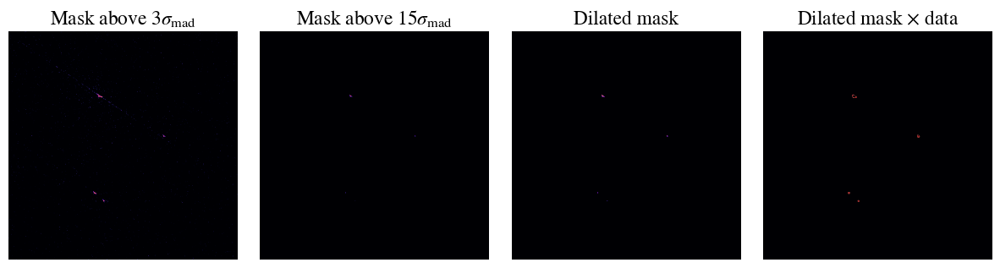

In [100]:
mask = mlibs.mask_dilation(file_list[-1],PLOT=True,sigma=15,iterations=1)[1]
mask_wslclean = mask*1.0 #mask in wsclean is inverted
mask_name = file_list[-1].replace('.fits','') + '_mask.fits'
pf.writeto(mask_name,mask_wslclean,overwrite=True)

In [101]:
if '4' in steps:
    iteration = '4'
    ############################################################################
    #### 3. Third interaction. Increase more the robust parameter, or use  ####
    ####    uvtapering. Consider even more extended emission (if there is). ####
    ############################################################################
    niter = 150000
    robust = 1.0
    
    run_wsclean(g_name, robust = robust,
                imsize = imsize, cell = cell,
                nsigma_automask='15.0',nsigma_autothreshold='1.0',
                n_interaction=iteration,savemodel=True,quiet=True,with_multiscale=False,
                datacolumn='CORRECTED_DATA',mask = mask_name,
                #    uvtaper=['0.04arcsec'],
                niter=niter,shift=FIELD_SHIFT,
                PLOT=False)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2679434 on Snharoco
2023-Nov-06 19:06:03.214413 Process 0 finished.
  1.0
Using mtmfs method.
4_update_model_image__IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_150000.briggs...1.0
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


>> Performing test-gaincal for solint=int...
Found no unflagged data at:   (time=2023/07/28/18:55:04.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:14.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:24.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:25.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:37.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:39.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:47.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:48.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:01.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:03.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:13.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:15.0 field=0 spw=0 cha

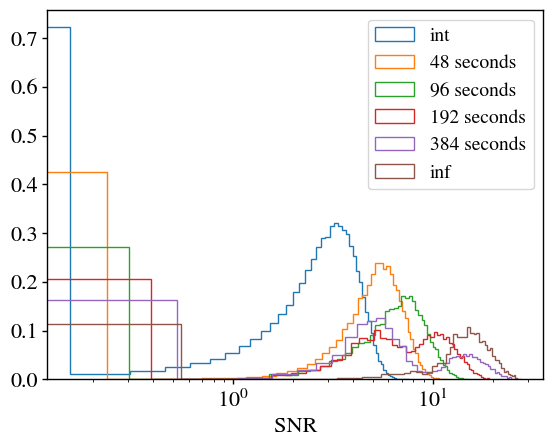

P(<=1.5) = 17.408234126984127  (int)
P(<=1.5) = 10.2880658436214  (48s)
P(<=1.5) = 8.39699074074074  (96s)
P(<=1.5) = 8.140432098765432  (192s)
P(<=1.5) = 8.59375  (384s)
P(<=1.5) = 6.25  (inf)


<Figure size 640x480 with 0 Axes>

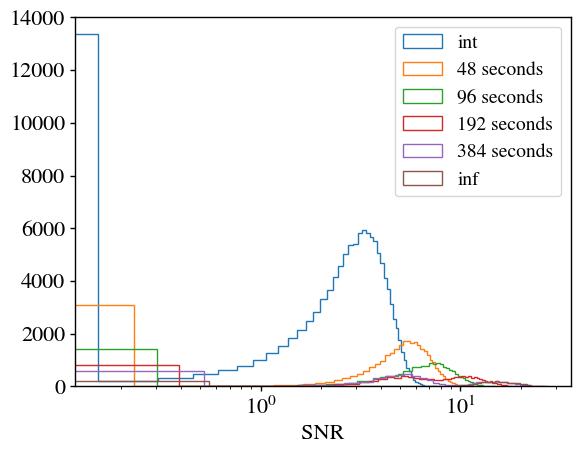

NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


In [102]:
if '4' in steps:
    iteration = '4'
    check_solutions(g_name, field, cut_off=1.5, n_interaction=iteration,
                    solnorm=solnorm, combine='', calmode='p',
                    gaintype='G', gain_tables_selfcal=gain_tables_selfcal)

1 of 25 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/18:57:33.9
1 of 26 solutions flagged due to SNR < 1.5 in spw=1 at 2023/07/28/18:55:17.7
2 of 25 solutions flagged due to SNR < 1.5 in spw=2 at 2023/07/28/18:55:17.6
1 of 26 solutions flagged due to SNR < 1.5 in spw=3 at 2023/07/28/18:55:17.7
1 of 26 solutions flagged due to SNR < 1.5 in spw=4 at 2023/07/28/18:55:17.6
2 of 26 solutions flagged due to SNR < 1.5 in spw=5 at 2023/07/28/18:55:17.6
1 of 26 solutions flagged due to SNR < 1.5 in spw=7 at 2023/07/28/18:55:17.6
2 of 25 solutions flagged due to SNR < 1.5 in spw=8 at 2023/07/28/18:55:17.7
1 of 25 solutions flagged due to SNR < 1.5 in spw=9 at 2023/07/28/18:55:17.6
1 of 25 solutions flagged due to SNR < 1.5 in spw=10 at 2023/07/28/18:55:17.6
1 of 26 solutions flagged due to SNR < 1.5 in spw=11 at 2023/07/28/18:55:17.7
1 of 25 solutions flagged due to SNR < 1.5 in spw=12 at 2023/07/28/18:55:17.6
1 of 26 solutions flagged due to SNR < 1.5 in spw=13 at 2023/07/28/18:55:

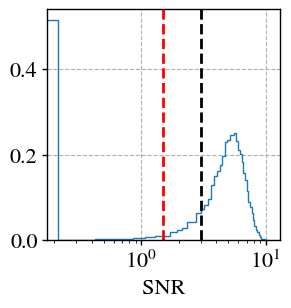

P(<=1.5) = 11.60300925925926  ()


In [103]:
if '4' in steps:
    solint = '24s'
    gaintype = 'T'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='calculate',
                                        PLOT=True,
                                        gain_tables=gain_tables_selfcal
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


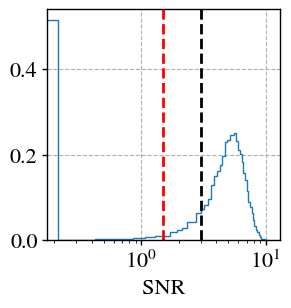

P(<=1.5) = 11.60300925925926  ()
     => Creating new flagbackup file before mode  p  selfcal ...


2023-11-06 19:09:50	WARN	flagmanager::::casa	Version name 'before_selfcal_mode_p' already exist. Will rename it to before_selfcal_mode_p.old.1699297789


     => Reporting data flagged before selfcal apply interaction 4 ...
field IRAS03359+15:  31.5 percent flagged
     => Reporting data flagged after selfcal apply interaction 4 ...
field IRAS03359+15:  34.7 percent flagged


In [104]:
if '4' in steps:
    solint = '24s'
    gaintype = 'T'
    calmode = 'p'
    minblperant = 3
    gain_tables_selfcal = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='apply',
                                        PLOT=True,
                                        gain_tables=gain_tables_selfcal
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

In [105]:
gain_tables_selfcal

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/3_selfcal_phase_IRAS03359+15.calibrated.avg12s__solint_96s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/4_selfcal_phase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb']

In [109]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/phasecal_image_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-1.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/phasecal_image_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/0_start_image__IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_10000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal_test_IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_150000.briggs...-2.0-MFS-image.fits',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/1_update_model_image__IRAS0335

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


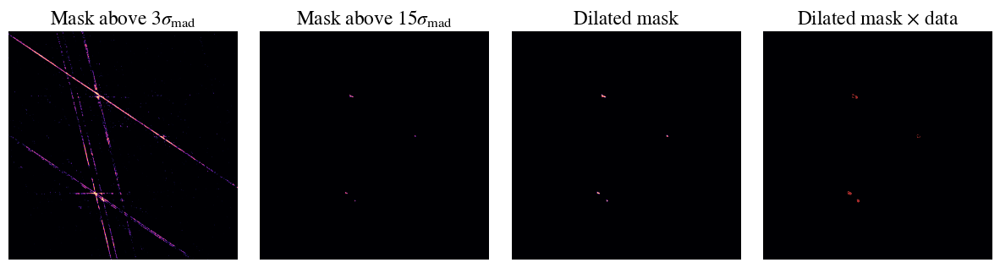

In [113]:
mask = mlibs.mask_dilation(file_list[-1],PLOT=True,sigma=15,iterations=1)[1]
mask_wslclean = mask*1.0 #mask in wsclean is inverted
mask_name = file_list[-1].replace('.fits','') + '_mask.fits'
pf.writeto(mask_name,mask_wslclean,overwrite=True)

In [115]:
steps = ['5']

In [116]:
if '5' in steps:
    iteration = '5'
    ############################################################################
    #### 3. Third interaction. Increase more the robust parameter, or use  ####
    ####    uvtapering. Consider even more extended emission (if there is). ####
    ############################################################################
    niter = 200000
    robust = 0.5
    
    run_wsclean(g_name, robust = robust,
                imsize = imsize, cell = cell,
                nsigma_automask='7.0',nsigma_autothreshold='1.5',
                n_interaction=iteration,savemodel=True,quiet=True,with_multiscale=True,
                datacolumn='CORRECTED_DATA',mask=mask_name,
                #    uvtaper=['0.04arcsec'],
                niter=niter,shift=FIELD_SHIFT,
                PLOT=True)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2724953 on Snharoco
2023-Nov-06 19:25:26.708261 Process 0 finished.
 ++>>   -multiscale-scales 0,5,20  -multiscale-scale-bias 0.8 -multiscale-gain 0.05 
 ++>> Using Multiscale deconvolver.
  0.5
Using mtmfs method.
5_update_model_image__IRAS03359+15.calibrated.avg12s_4096x4096_0.05arcsec_200000.briggs.multiscale..0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


>> Performing test-gaincal for solint=int...
Found no unflagged data at:   (time=2023/07/28/18:55:04.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:14.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:24.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:25.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:37.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:39.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:47.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:55:48.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:01.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:03.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:13.0 field=0 spw=0 chan=0)
Found no unflagged data at:   (time=2023/07/28/18:56:15.0 field=0 spw=0 cha

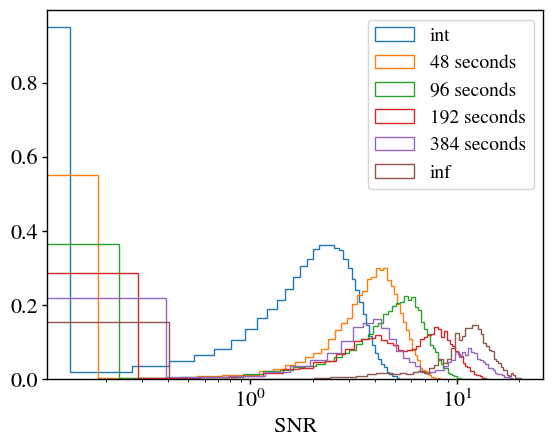

P(<=3.0) = 77.0949074074074  (int)
P(<=3.0) = 25.70730452674897  (48s)
P(<=3.0) = 17.037037037037035  (96s)
P(<=3.0) = 16.63773148148148  (192s)
P(<=3.0) = 19.010416666666668  (384s)
P(<=3.0) = 7.03125  (inf)


<Figure size 640x480 with 0 Axes>

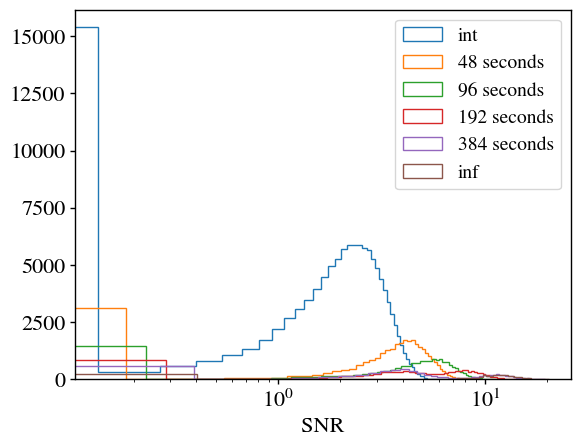

NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


In [117]:
if '5' in steps:
    iteration = '5'
    check_solutions(g_name, field, cut_off=3.0, n_interaction=iteration,
                    solnorm=solnorm, combine='', calmode='ap',
                    gaintype='G', gain_tables_selfcal=gain_tables_selfcal)

3 of 24 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/18:55:17.5
1 of 24 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/18:56:22.2
1 of 24 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/18:57:09.9
2 of 26 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/18:57:58.4
1 of 26 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/19:00:22.1
1 of 25 solutions flagged due to SNR < 1.5 in spw=0 at 2023/07/28/19:01:33.5
1 of 26 solutions flagged due to SNR < 1.5 in spw=1 at 2023/07/28/18:55:34.2
3 of 23 solutions flagged due to SNR < 1.5 in spw=2 at 2023/07/28/18:55:17.5
1 of 25 solutions flagged due to SNR < 1.5 in spw=2 at 2023/07/28/18:55:35.1
3 of 25 solutions flagged due to SNR < 1.5 in spw=3 at 2023/07/28/18:55:17.6
1 of 26 solutions flagged due to SNR < 1.5 in spw=3 at 2023/07/28/18:58:21.9
1 of 25 solutions flagged due to SNR < 1.5 in spw=4 at 2023/07/28/18:55:17.5
4 of 25 solutions flagged due to SNR < 1.5 in spw=7 at 2023/07/28/18:55:17.5

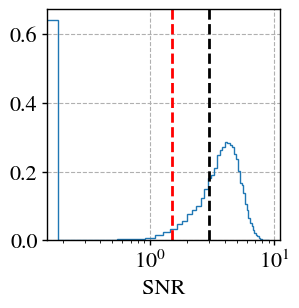

P(<=1.5) = 12.911522633744857  ()


In [120]:
if '5' in steps:
    solint = '24s'
    gaintype = 'T'
    calmode = 'ap'
    minblperant = 4
    gain_tables_selfcal = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='calculate',
                                        PLOT=True,
                                        gain_tables=gain_tables_selfcal
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

 => Using existing caltable with same parameters asked.
 => Not computing again...
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).
NOTICE: Exporting to images in screen resolution is currently not working.  Switching to high resolution (which is slower, but works).


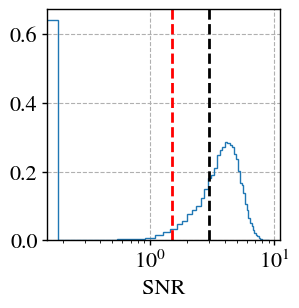

P(<=1.5) = 12.911522633744857  ()
     => Creating new flagbackup file before mode  ap  selfcal ...


2023-11-06 19:34:12	WARN	flagmanager::::casa	Version name 'before_selfcal_mode_ap' already exist. Will rename it to before_selfcal_mode_ap.old.1699299252


     => Reporting data flagged before selfcal apply interaction 5 ...
field IRAS03359+15:  34.7 percent flagged
     => Reporting data flagged after selfcal apply interaction 5 ...
field IRAS03359+15:  36.4 percent flagged


In [121]:
if '5' in steps:
    solint = '24s'
    gaintype = 'T'
    calmode = 'ap'
    minblperant = 4
    gain_tables_selfcal = self_gain_cal(g_name,
                                        n_interaction=iteration,
                                        minsnr = 1.5,
                                        solint = solint,
                                        flagbackup=True,
                                        gaintype=gaintype,combine='',
                                        calmode=calmode,
                                        action='apply',
                                        PLOT=True,
                                        gain_tables=gain_tables_selfcal
                                        # gain_tables=gain_tables_selfcal_temp
                                        )

In [122]:
gain_tables_selfcal

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/3_selfcal_phase_IRAS03359+15.calibrated.avg12s__solint_96s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/4_selfcal_phase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/5_selfcal_ampphase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb']

In [123]:
split(vis=g_vis,outputvis=g_name+'.selfcalibrated_p96G-p24G-ap24T.ms',datacolumn='corrected')

In [124]:
niter = 150000
robust = 0.5
run_wsclean(g_name+'.selfcalibrated_p96G-p24G-ap24T.ms', robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_image_trial2',
            nsigma_automask='12.0',nsigma_autothreshold='3.0',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=False,
            datacolumn='DATA',shift=FIELD_SHIFT,
            # uvtaper=['0.08arcsec'],
            niter=niter,
            PLOT=False)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 2772500 on Snharoco
2023-Nov-06 19:41:57.762586 Process 0 finished.
  0.5
Using mtmfs method.
selfcal_image_trial2_IRAS03359+15.calibrated.avg12s.selfcalibrated_p96G-p24G-ap24T_4096x4096_0.05arcsec_150000.briggs...0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [126]:
gain_tables_selfcal

['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/3_selfcal_phase_IRAS03359+15.calibrated.avg12s__solint_96s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/4_selfcal_phase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/5_selfcal_ampphase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb']

In [127]:
"""
['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/3_selfcal_phase_IRAS03359+15.calibrated.avg12s__solint_96s_minsnr_1.5_combine_gtype_G.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/4_selfcal_phase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb',
 '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/5_selfcal_ampphase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb']
"""

"\n['/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/3_selfcal_phase_IRAS03359+15.calibrated.avg12s__solint_96s_minsnr_1.5_combine_gtype_G.tb',\n '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/4_selfcal_phase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb',\n '/media/sagauga/starbyte/astronomical_data/LIRGI_sample/vla/23A-324/C_band/IRAS03/autoselfcalibration_wsclean/selfcal/5_selfcal_ampphase_incremental_IRAS03359+15.calibrated.avg12s__solint_24s_minsnr_1.5_combine_gtype_T.tb']\n"

In [107]:
niter = 150000
robust = 0.5
run_wsclean(g_name, robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_image_trial2',
            nsigma_automask='6.0',nsigma_autothreshold='3.0',
            n_interaction='',savemodel=False,quiet=True,with_multiscale=True,
            datacolumn='CORRECTED_DATA',
            # uvtaper=['0.1arcsec'],
            niter=niter,
            PLOT=False)


Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 1606231 on Snharoco
2023-Nov-03 18:39:36.416364 Process 0 finished.
 ++>>   -multiscale-scales 0,5,20  -multiscale-scale-bias 0.8 -multiscale-gain 0.05 
 ++>> Using Multiscale deconvolver.
  0.5
Using mtmfs method.
selfcal_image_trial2_ARP220.calibrated_RR_LL.avg12s_2048x2048_0.05arcsec_150000.briggs.multiscale..0.5
 Image Statistics:


imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:346: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [58]:
plotms(vis=gain_tables_selfcal[-1],yaxis='phase',xaxis='time',coloraxis='spw')

## Lets compare the self-cal results

In [21]:
# cpath = f'ls -ltr {path}*-MFS-image.fits'
# os.system(cpath)

In [23]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
file_list

['/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/phase_cal_image_Arp299_multi_7x_C_EVLA_RR_LL_6144x6144_0.05arcsec_10000.briggs...0.0-MFS-image.fits',
 '/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/0_start_image__Arp299_multi_7x_C_EVLA_RR_LL_6144x6144_0.05arcsec_10000.briggs...-1.0-MFS-image.fits',
 '/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/1_update_model_image__Arp299_multi_7x_C_EVLA_RR_LL_6144x6144_0.05arcsec_10000.briggs...-1.0-MFS-image.fits',
 '/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/2_update_model_image__Arp299_multi_7x_C_EVLA_RR_LL_6144x6144_0.05arcsec_50000.briggs...-1.0-MFS-image.fits',
 '/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/3_update_model_image__Arp299_multi_7x_C_EVLA_RR_LL_6144x6144_0.05arcsec_100000

  >> Center -->  3065 3068
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > start image')

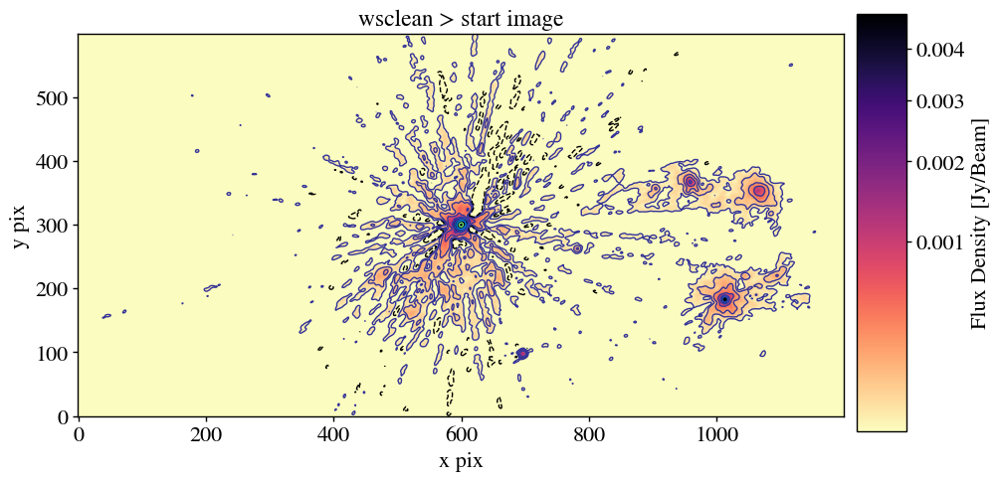

In [31]:
ax = eimshow(do_cutout_2D(ctn(file_list[0]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > start image')

  >> Center -->  3065 3067
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-cal |t p|')

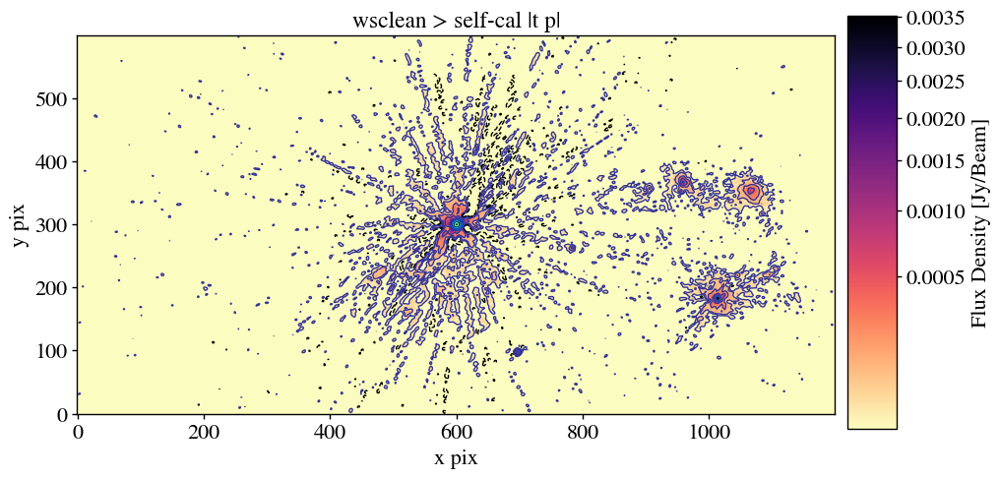

In [37]:
ax = eimshow(do_cutout_2D(ctn(file_list[1]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > self-cal |t p|')

  >> Center -->  3065 3067
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-cal |t p| + |t p|')

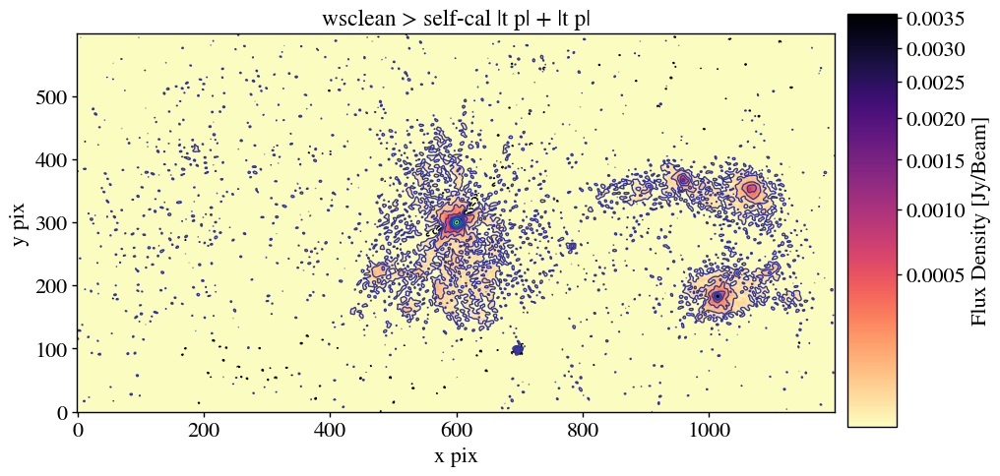

In [38]:
ax = eimshow(do_cutout_2D(ctn(file_list[2]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > self-cal |t p| + ||t p||')

  >> Center -->  3065 3068
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-cal |t p| + ||t p| + |t ap|| ')

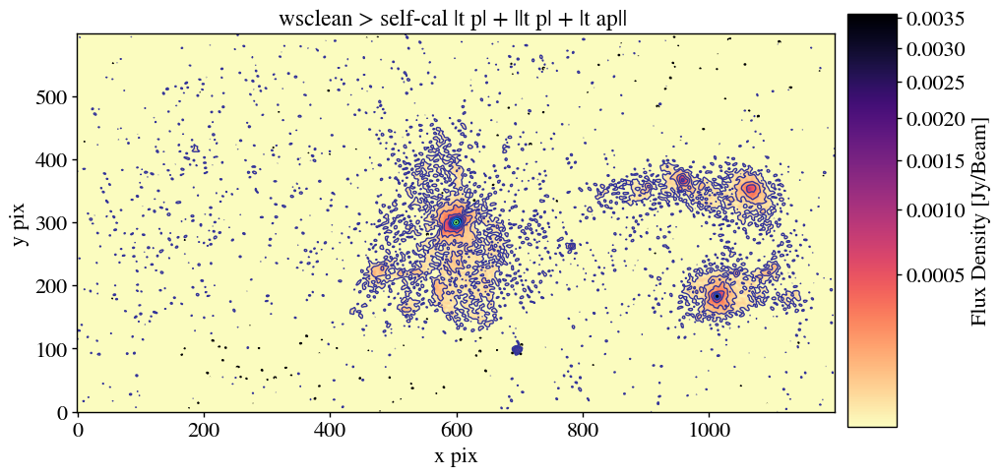

In [42]:
ax = eimshow(do_cutout_2D(ctn(file_list[3]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > self-cal |t p| + ||t p| + |t ap|| ')

  >> Center -->  3065 3068
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-cal Trial 2 ==>> |p|')

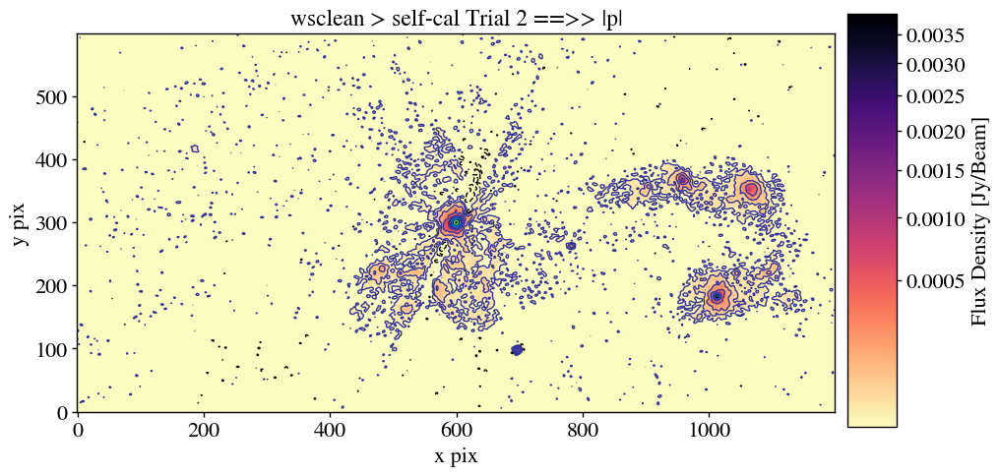

In [43]:
ax = eimshow(do_cutout_2D(ctn(file_list[4]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > self-cal Trial 2 ==>> |p|')

  >> Center -->  3065 3068
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-cal Trial 2 ==>> |p| + |p|')

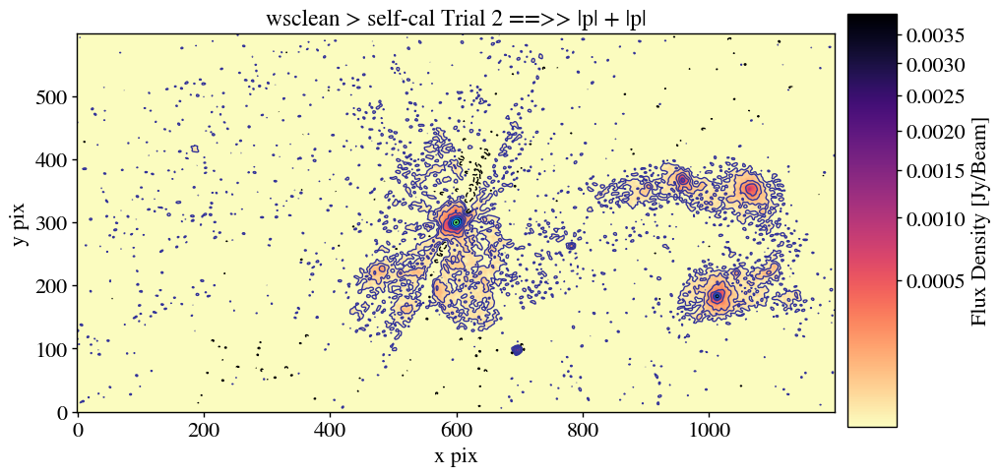

In [55]:
ax = eimshow(do_cutout_2D(ctn(file_list[4]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > self-cal Trial 2 ==>> |p| + |p|')

  >> Center -->  3065 3068
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-cal Trial 2 ==>> | |p| + |p| + |ap| |')

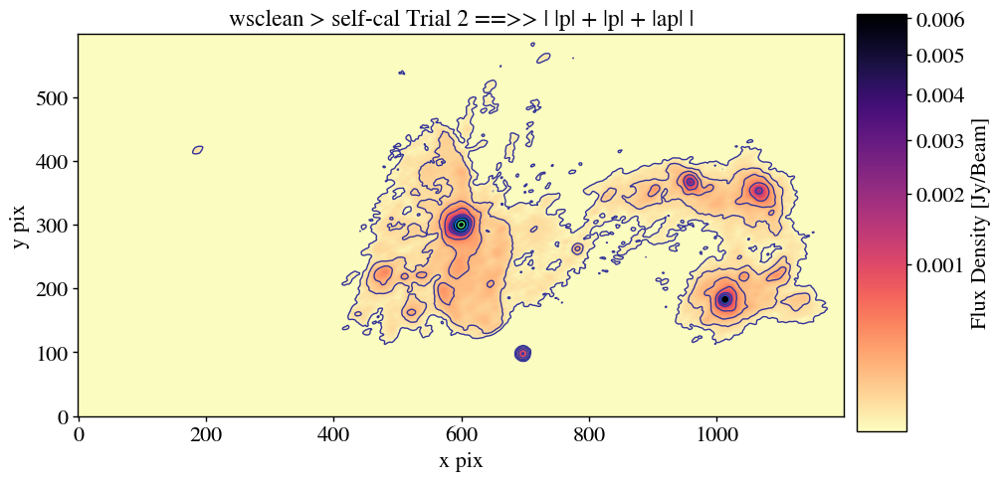

In [53]:
ax = eimshow(do_cutout_2D(ctn(file_list[6]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > self-cal Trial 2 ==>> | |p| + |p| + |ap| |')

In [56]:
gain_tables_selfcal

['/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/selfcal/3_selfcal_phase_Arp299_multi_7x_C_EVLA_RR_LL__solint_36s_minsnr_3.0_combine_gtype_G.tb',
 '/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/selfcal/4_selfcal_phase_incremental_Arp299_multi_7x_C_EVLA_RR_LL__solint_int_minsnr_5.0_combine_gtype_G.tb',
 '/media/sagauga/galnet/LIRGI_Sample/VLA-Archive/A_config/C_band/Arp299/autoselfcalibration_wsclean/selfcal/5_selfcal_ampphase_incremental_Arp299_multi_7x_C_EVLA_RR_LL__solint_int_minsnr_3.0_combine_gtype_G.tb']

In [54]:
split(vis=g_vis,outputvis=g_name+'.selfcalibrated_2x_p-p-ap.ms',datacolumn='corrected')

In [59]:
split(vis=g_vis,outputvis=g_name+'.selfcalibrated_2x_p-p-ap.avg60s.ms',datacolumn='corrected',timebin='60s')

Run final image

In [6]:
niter = 200000
robust = 0.5  
run_wsclean(g_name+'.selfcalibrated_2x_p-p-ap.avg60s.ms', robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_image_final',
            nsigma_automask='3.0',nsigma_autothreshold='0.1',
            n_interaction='',savemodel=False,quiet=False,with_multiscale=True,
            datacolumn='DATA',
            #    uvtaper=['0.04arcsec'],
            niter=niter,
            PLOT=False)

Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 125552 on Snharoco
2023-Oct-30 03:41:55.106797 
2023-Oct-30 03:41:55.106813 WSClean version 3.3 (2023-03-31)
2023-Oct-30 03:41:55.106814 This software package is released under the GPL version 3.
2023-Oct-30 03:41:55.106814 Author: André Offringa (offringa@gmail.com).
2023-Oct-30 03:41:55.106815 
2023-Oct-30 03:41:55.192536 === IMAGING TABLE ===
2023-Oct-30 03:41:55.192545        # Pol Ch JG ²G FG FI In Freq(MHz)
2023-Oct-30 03:41:55.192545 | Independent group:
2023-Oct-30 03:41:55.192547 +-+-J- 0  I   0  0  0  0  0  0  3975-4688 (1203)
2023-Oct-30 03:41:55.192793   +-J- 1  I   1  0  1  1  0  0  4688-5523 (1203)
2023-Oct-30 03:41:55.192795   +-J- 2  I   2  0  2  2  0  0  5522-6239 (1203)
2023-Oct-30 03:41:55.192796   +-J- 3  I   3  0  3  3  0  0  6239-8223 (1203)
2023-Oct-30 03:41:55.192842 Reordering...
2023-Oct-30 03:41:55.232207 WARNING: This measurement set has no or an invalid WEIGHT_SPECTRUM column; will use less informative WEIGHT column.
2023-Oct-30 03:42:04.342353 

imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:309: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [7]:
niter = 150000
robust = 0.5  
run_wsclean(g_name+'.selfcalibrated_2x_p-p-ap.avg60s.ms', robust = robust,
            imsize = imsize, cell = cell,base_name='selfcal_image_final',
            nsigma_automask='7.0',nsigma_autothreshold='0.1',
            n_interaction='',savemodel=False,quiet=False,with_multiscale=True,
            datacolumn='DATA',
            #    uvtaper=['0.04arcsec'],
            niter=niter,
            PLOT=False)

Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified
Authorization required, but no authorization protocol specified


Node 0, PID 364211 on Snharoco
2023-Oct-30 04:26:35.336294 
2023-Oct-30 04:26:35.336314 WSClean version 3.3 (2023-03-31)
2023-Oct-30 04:26:35.336317 This software package is released under the GPL version 3.
2023-Oct-30 04:26:35.336318 Author: André Offringa (offringa@gmail.com).
2023-Oct-30 04:26:35.336319 
2023-Oct-30 04:26:35.369284 === IMAGING TABLE ===
2023-Oct-30 04:26:35.369293        # Pol Ch JG ²G FG FI In Freq(MHz)
2023-Oct-30 04:26:35.369294 | Independent group:
2023-Oct-30 04:26:35.369296 +-+-J- 0  I   0  0  0  0  0  0  3975-4688 (1203)
2023-Oct-30 04:26:35.369329   +-J- 1  I   1  0  1  1  0  0  4688-5523 (1203)
2023-Oct-30 04:26:35.369331   +-J- 2  I   2  0  2  2  0  0  5522-6239 (1203)
2023-Oct-30 04:26:35.369332   +-J- 3  I   3  0  3  3  0  0  6239-8223 (1203)
2023-Oct-30 04:26:35.369375 Reordering...
2023-Oct-30 04:26:35.418106 WARNING: This measurement set has no or an invalid WEIGHT_SPECTRUM column; will use less informative WEIGHT column.
2023-Oct-30 04:26:44.940020 

imaging_with_wsclean.py:141: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if uvtaper is not '':
imaging_with_wsclean.py:309: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if deconvolver_options is not '' or []:


In [8]:
imsize

6144

In [10]:
file_list = glob.glob(f"{path}*MFS-image.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
# file_list

In [12]:
def do_cutout_2D(image_data, box_size=(300,300), center=None, return_='data'):
    """
    Fast cutout of a numpy array.

    Returs: numpy data array or a box for that cutout, if asked.
    """

    if center is None:
        x0, y0= nd.maximum_position(image_data)
        print('  >> Center --> ', x0, y0)
        if x0-box_size[0]>1:
            xin, xen, yin, yen = x0 - box_size[0], x0 + box_size[0], \
                                 y0 - box_size[1], y0 + box_size[1]
        else:
            print('Box size is larger than image!')
            return ValueError
    else:
        xin, xen, yin, yen = center[0] - box_size[0], center[0] + box_size[0], \
            center[1] - box_size[1], center[1] + box_size[1]
    if return_ == 'data':
        data_cutout = image_data[xin:xen, yin:yen]
        return (data_cutout)
    if return_ == 'box':
        box = xin, xen, yin, yen  # [xin:xen,yin:yen]
        return(box)

  >> Center -->  3065 3068
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-calibrated')

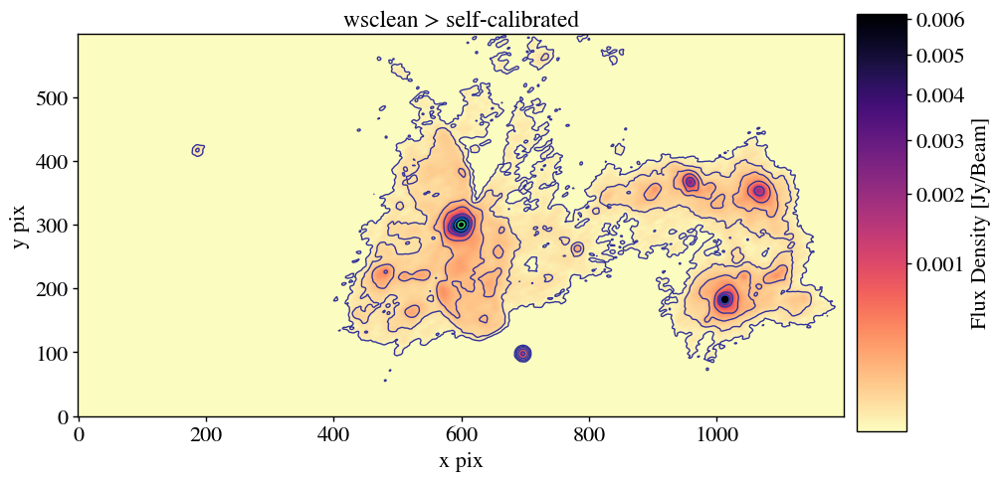

In [13]:
ax = eimshow(do_cutout_2D(ctn(file_list[-1]),box_size=(300,600)),vmin_factor=2,vmax_factor=0.1,figsize=(10,5))
ax.set_title('wsclean > self-calibrated')

In [14]:
file_list = glob.glob(f"{path}*MFS-model.fits")
file_list.sort(key=os.path.getmtime, reverse=False)
# file_list

  >> Center -->  3065 3068
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


Text(0.5, 1.0, 'wsclean > self-calibrated')

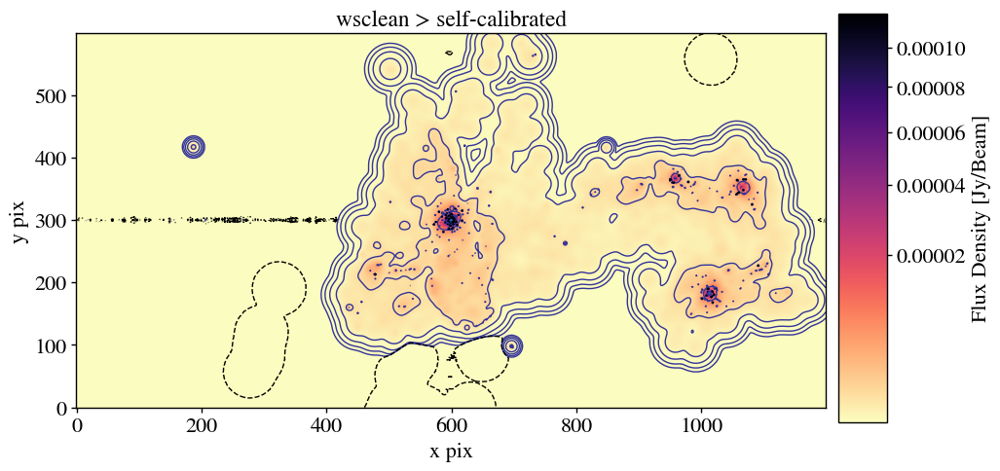

In [18]:
ax = eimshow(do_cutout_2D(ctn(file_list[-1]),box_size=(300,600)),vmin_factor=10,vmax_factor=0.01,figsize=(10,5))
ax.set_title('wsclean > self-calibrated')